In [267]:
## ASE analysis pipeline adapted from the following: 
# Scanpy: https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html
#load programs 
import scanpy as sc
import decoupler as dc
import pybiomart
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# Plotting options, change to your liking
sc.set_figure_params(dpi=800, dpi_save=500)
sc.set_figure_params(figsize=(4, 4))

In [ ]:
#load data 
adata=sc.read_10x_h5('filtered_feature_bc_matrix-8.h5', genome=None, gex_only=True, backup_url=None)

In [269]:
#make names unique
adata.var_names_make_unique()

In [270]:
#assign age to samples 
def determine_age(obs_name):
    if obs_name.endswith(("1", "6", "7", "8")):
        return "old"
    else:
        return "young"
adata.obs['age'] = [determine_age(obs_name) for obs_name in adata.obs_names]


In [271]:
#name sample based on barcode number 
adata.obs['sample'] = adata.obs_names.str[-1]

In [272]:
# get gene IDs by removing mus__ or cast_
adata.var['gene_ids'] = adata.var['gene_ids'].str[5:]

In [273]:
# stats for mitochondrial genes, ribo genes, hb genes
adata.var["mt"] = adata.var_names.str.startswith("cast_Mt", "mus__Mt")
# ribo genes
adata.var["ribo"] = adata.var_names.str.startswith(("cast_Rps", "cast_Rpl", "mus__Rps", "mus__Rpl"))
# hb genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

In [274]:
#QC 
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

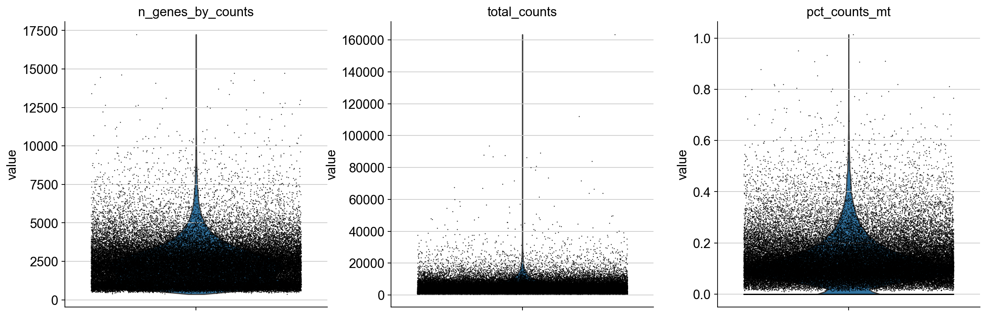

In [275]:
#QC violin plot 
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

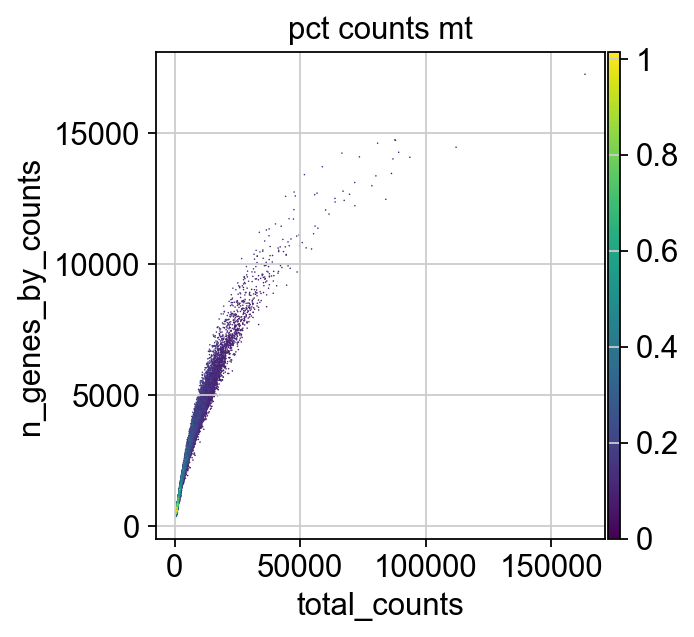

In [276]:
#QC scatter plot
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")


In [277]:
#filtering by min genes and min cells 
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)

In [283]:
adata

View of AnnData object with n_obs × n_vars = 59640 × 46837
    obs: 'age', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'scrublet'

In [279]:
#predict doublets
sc.pp.scrublet(adata)

In [280]:
# remove predicted doublets 
adatadub = adata[adata.obs.predicted_doublet==True,:]
adata = adata[~adata.obs.predicted_doublet==True,:]


In [281]:
adata 

View of AnnData object with n_obs × n_vars = 59640 × 46837
    obs: 'age', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'scrublet'

In [282]:
adatadub

View of AnnData object with n_obs × n_vars = 2773 × 46837
    obs: 'age', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'scrublet'

In [284]:
##norm 

In [285]:
# Saving count 
adata.layers["counts"] = adata.X.copy()


/var/folders/br/mvlc6w2543d4kgl4gwbwydxw0000gn/T/ipykernel_7611/3979531090.py:2: ImplicitModificationWarning: Setting element `.layers['counts']` of view, initializing view as actual.
  adata.layers["counts"] = adata.X.copy()


In [286]:
# Save raw counts
adata.layers['counts'] = adata.X 

In [287]:
# Normalizing to median total counts
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)
adata.layers['normalized'] = adata.X



In [288]:
#highly variable genes 
sc.pp.highly_variable_genes(adata, n_top_genes=2000) ## can add batch key 

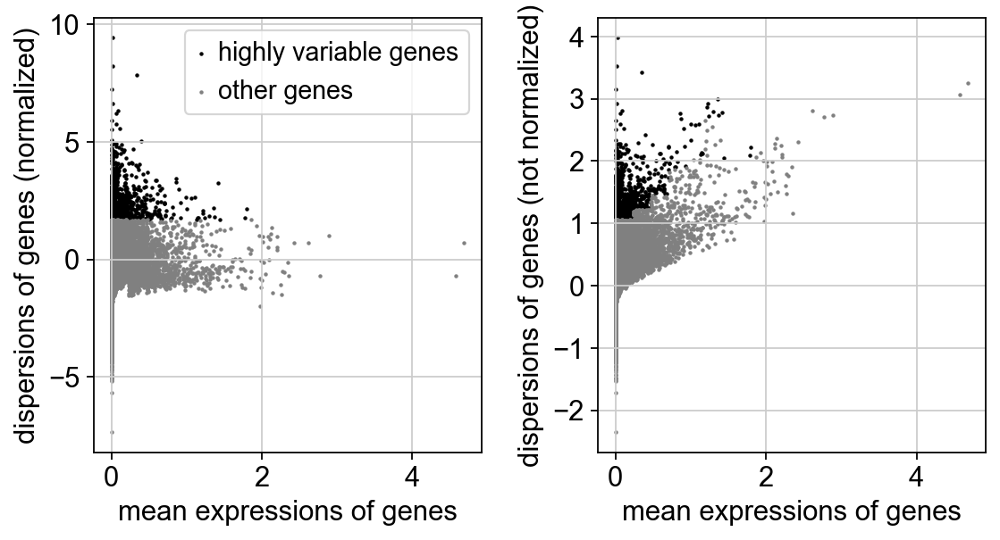

In [289]:
#plot highly variable 
sc.pl.highly_variable_genes(adata)

In [290]:
#PCA
sc.tl.pca(adata)

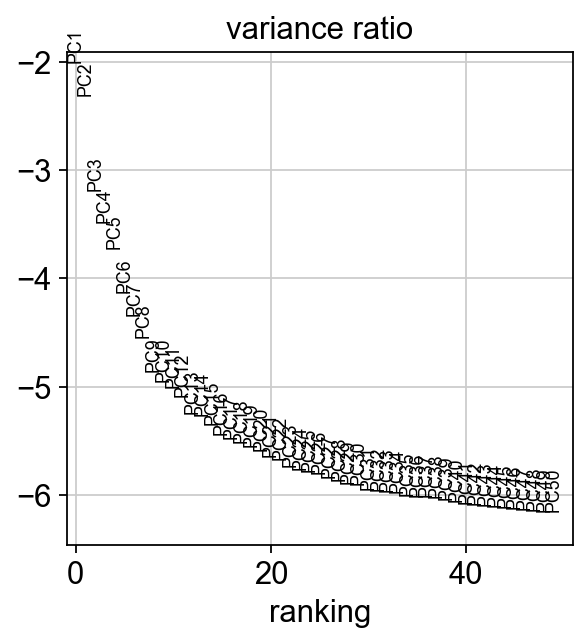

In [291]:
#PCA variance ratio 
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

In [292]:
#compute neighboors 
sc.pp.neighbors(adata)

In [293]:
#UMAP
sc.tl.umap(adata)

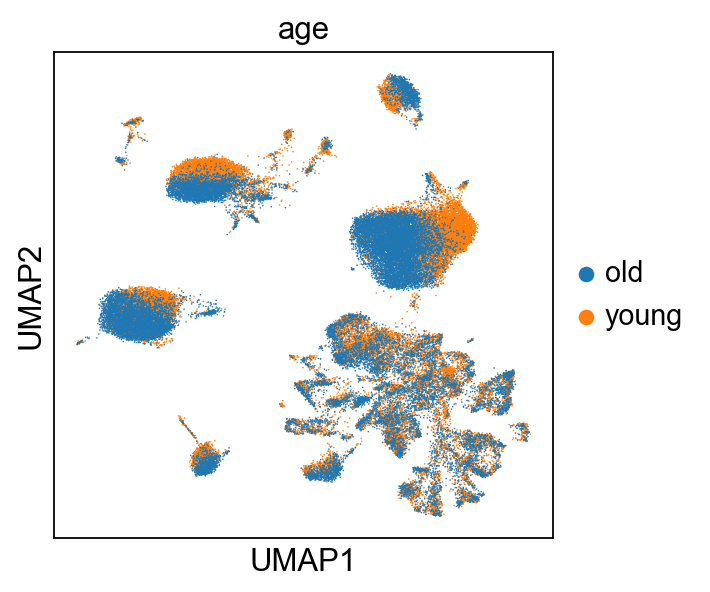

In [294]:
#plot UMAP
sc.pl.umap(
    adata,
    color="age",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

In [295]:
#leiden groupings 
sc.tl.leiden(adata, flavor="igraph", n_iterations=2)

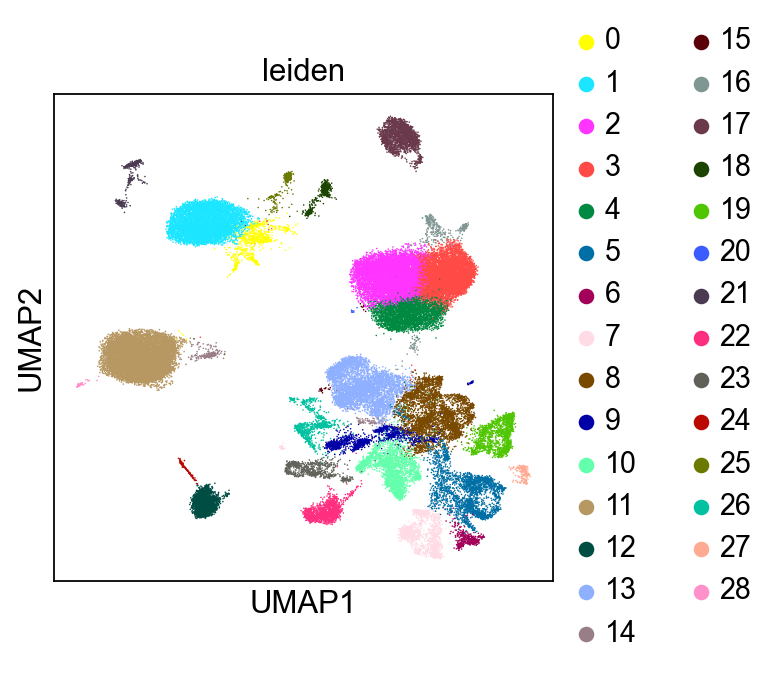

In [296]:
#plot leiden groupings 
sc.pl.umap(adata, color=["leiden"])

In [297]:
# leiden resolutions
for res in [0.02, 0.05, 0.1, 0.3, 0.5, 1.0, 1.5, 2.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )


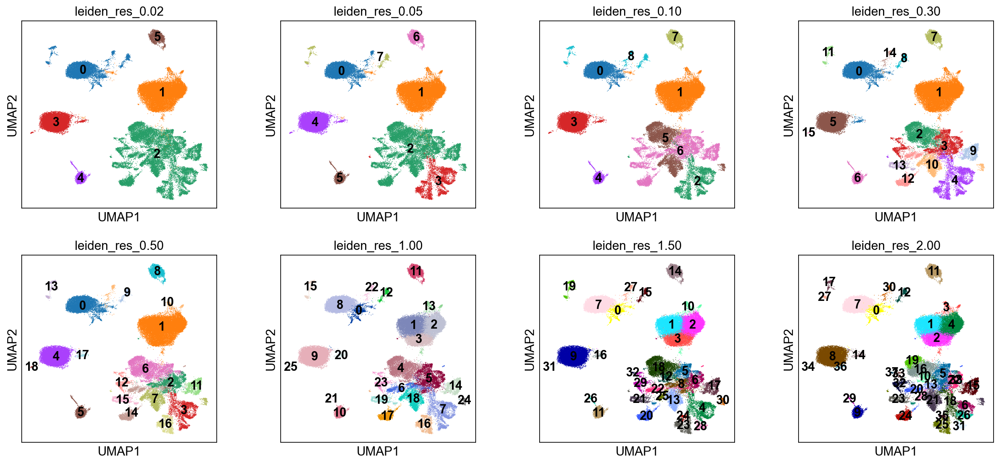

In [298]:
# plot leiden resolutions
sc.pl.umap(
    adata,
    color=["leiden_res_0.02", "leiden_res_0.05", "leiden_res_0.10","leiden_res_0.30", "leiden_res_0.50", "leiden_res_1.00", "leiden_res_1.50", "leiden_res_2.00"],
    legend_loc="on data",
)


In [299]:
# Obtain cluster-specific genes rankings 
sc.tl.rank_genes_groups(adata, groupby="leiden_res_0.50", method="wilcoxon")


In [300]:
# export ranked genes 
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
dat = pd.DataFrame({group + '_' + key[:1]: result[key][group] for group in groups for key in ['names', 'logfoldchanges','scores','pvals']})
dat.to_csv("20240628_adata_8_0_50_noneo12.csv",sep=',', index=False, encoding='utf-8')

In [301]:
#rename clusters based on marker genes 
new_cluster_names = [
'Astro_1',
'DG',
'Glut_1',
'GABA_1',
'Oligo_1',
'OPC',
'CA1',
'CA3',   
'MicroPVM', 
'VLMC',
'Mixed_1',
'Glut_2',
'Glut_3',
'Endo',
'Glut_4',
'Glut_5',
'GABA_2',
'Oligo_2',
'Oligo_3'

]
adata.rename_categories('leiden_res_0.50', new_cluster_names)


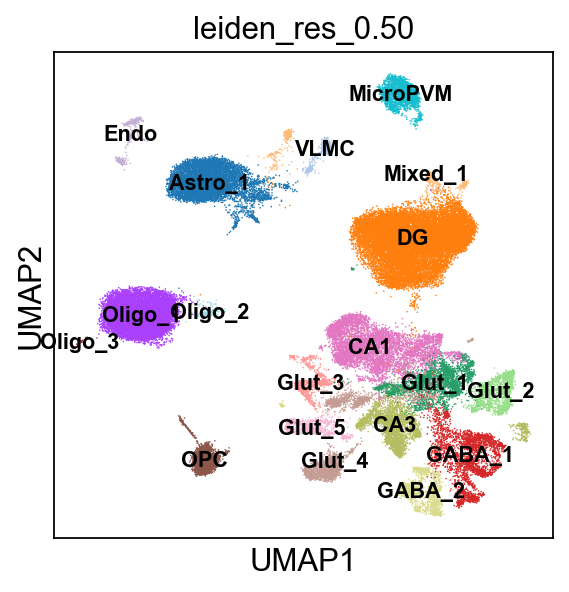

In [302]:
#show names on UMAP 
sc.pl.umap(adata, color=["leiden_res_0.50"], legend_loc='on data', legend_fontsize='x-small')

In [303]:
#rename 
adata.obs['leiden_res_0.50'][adata.obs['leiden_res_0.50'].isin(['Oligo_2', 'Oligo_3'])]='Oligo_1'
adata.obs['leiden_res_0.50']=adata.obs['leiden_res_0.50'].astype('str').astype('category')
adata.obs['leiden_res_0.50'].cat.rename_categories(np.arange(len(np.unique(adata.obs['leiden_res_0.50']))).astype('str'))



AAACCCAAGAGGGTGG-1     0
AAACCCAAGCGAAACC-1     3
AAACCCACAACAGCCC-1     5
AAACCCACACACCGCA-1     3
AAACCCACACGGCACT-1     0
                      ..
TTTGTTGGTTTCCATT-8    15
TTTGTTGTCCGCCTAT-8     8
TTTGTTGTCGCTTGAA-8     3
TTTGTTGTCTATCACT-8     1
TTTGTTGTCTGGAGAG-8     3
Name: leiden_res_0.50, Length: 59640, dtype: category
Categories (17, object): ['0', '1', '2', '3', ..., '13', '14', '15', '16']

In [304]:
#rename  
adata.obs['leiden_res_0.50'][adata.obs['leiden_res_0.50'].isin(['Glut_2', 'Glut_3', 'Glut_4', 'Glut_5'])]='Glut_1'
adata.obs['leiden_res_0.50']=adata.obs['leiden_res_0.50'].astype('str').astype('category')
adata.obs['leiden_res_0.50'].cat.rename_categories(np.arange(len(np.unique(adata.obs['leiden_res_0.50']))).astype('str'))



AAACCCAAGAGGGTGG-1     0
AAACCCAAGCGAAACC-1     3
AAACCCACAACAGCCC-1     5
AAACCCACACACCGCA-1     3
AAACCCACACGGCACT-1     0
                      ..
TTTGTTGGTTTCCATT-8    11
TTTGTTGTCCGCCTAT-8     7
TTTGTTGTCGCTTGAA-8     3
TTTGTTGTCTATCACT-8     1
TTTGTTGTCTGGAGAG-8     3
Name: leiden_res_0.50, Length: 59640, dtype: category
Categories (13, object): ['0', '1', '2', '3', ..., '9', '10', '11', '12']

In [305]:
#rename 
adata.obs['leiden_res_0.50'][adata.obs['leiden_res_0.50'].isin(['GABA_2'])]='GABA_1'
adata.obs['leiden_res_0.50']=adata.obs['leiden_res_0.50'].astype('str').astype('category')
adata.obs['leiden_res_0.50'].cat.rename_categories(np.arange(len(np.unique(adata.obs['leiden_res_0.50']))).astype('str'))



AAACCCAAGAGGGTGG-1     0
AAACCCAAGCGAAACC-1     3
AAACCCACAACAGCCC-1     5
AAACCCACACACCGCA-1     3
AAACCCACACGGCACT-1     0
                      ..
TTTGTTGGTTTCCATT-8    10
TTTGTTGTCCGCCTAT-8     6
TTTGTTGTCGCTTGAA-8     3
TTTGTTGTCTATCACT-8     1
TTTGTTGTCTGGAGAG-8     3
Name: leiden_res_0.50, Length: 59640, dtype: category
Categories (12, object): ['0', '1', '2', '3', ..., '8', '9', '10', '11']

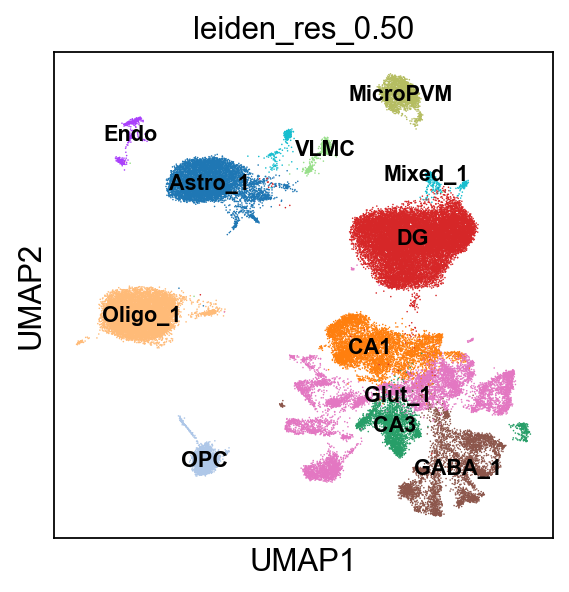

In [306]:
#visualize 
sc.pl.umap(adata, color=["leiden_res_0.50"], legend_loc='on data', legend_fontsize='x-small')

In [307]:
#rename leiden_res_0.50 cell type 
adata.obs["cell_type"] = adata.obs["leiden_res_0.50"].astype("category")

In [308]:
#rename 
old_to_new = dict(
    Astro_1='Astro',
    Glut_1='Glut_Undef',
    GABA_1='GABA',
    Mixed_1='Mixed',
    DG='DG',
    Oligo_1='Oligo',
    OPC='OPC',
    CA1='CA1',
    CA3='CA3',
    MicroPVM='MG',
    VLMC='VLMC',
    Endo='Endo',

)
adata.obs['cell_type'] = (
    adata.obs['cell_type']
    .map(old_to_new)
    .astype('category')
)

In [309]:
# Remove unannotated cells
adata = adata[~adata.obs['cell_type'].isnull()]

/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


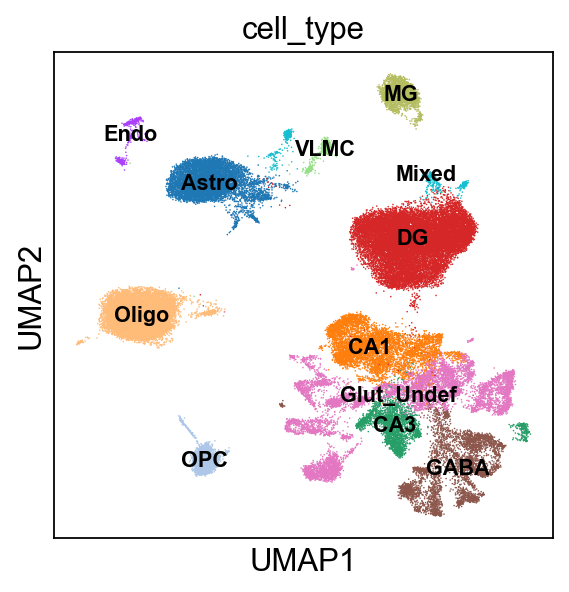

In [310]:
sc.pl.umap(adata, color=["cell_type"], legend_loc='on data', legend_fontsize='x-small')

In [311]:
#reorder neames 
#adata.obs['cell_type'] = adata.obs['cell_type'].cat.reorder_categories(['DG', 'CA1', 'CA3', 'Glut_Undef', 'GABA', 'OPC', "Oligo", "Astro", "MG", "VLMC", "Endo", "Mixed"])

In [312]:
#count nuclei by cell type and age 
obs_df = adata.obs
table = obs_df.groupby(['cell_type', 'age']).size().unstack(fill_value=0)
print(table)

age          old  young
cell_type              
Astro       3322   3613
CA1         2438   3391
CA3         1237   1401
DG          9419   8018
Endo         159    236
GABA        1841   2274
Glut_Undef  3716   4220
MG          1090    906
Mixed        153    394
OPC          896   1112
Oligo       5290   4028
VLMC         122    364


In [313]:
# group genes by chromosome, can export genes from Ensembl biomart  
chrx_genes = {x.strip() for x in open ('/Users/margaretgadek/Downloads/cayce_mouse_X_genes_ex_mc.txt')}
adata.var["is_chrx"] = adata.var_names.isin(chrx_genes)
chrx_adata = adata[: , adata.var.is_chrx].copy()

chr3_genes = {x.strip() for x in open ('/Users/margaretgadek/ch3.txt')}
adata.var["is_chr3"] = adata.var_names.isin(chr3_genes)
chr3_adata = adata[: , adata.var.is_chr3].copy()

chr4_genes = {x.strip() for x in open ('/Users/margaretgadek/ch4.txt')}
adata.var["is_chr4"] = adata.var_names.isin(chr4_genes)
chr4_adata = adata[: , adata.var.is_chr4].copy()



In [314]:
## compare groups of cells for escape analysis ## 

In [315]:
#autosome counts 
auto_adata = adata[:,~adata.var.is_chrx].copy()
auto_adata = auto_adata.to_df()
auto_adata = auto_adata.transpose()

auto_adata = auto_adata.copy()
auto_adata['sum'] = auto_adata.sum(numeric_only=True, axis=1)
auto_adata = auto_adata['sum']
auto_adata.to_csv("auto_adatao12.csv")

In [316]:
#old young data
chrx_adata_o = chrx_adata[chrx_adata.obs.age == 'old']
chrx_adata_y = chrx_adata[chrx_adata.obs.age == 'young']

In [317]:
## plots of Xi expression 

In [318]:
#genes that increase escape with aging 
Escinci = {
    "Ftx": ["cast_Ftx"],
    "Gpm6b": ["cast_Gpm6b"],
    "Med14": ["cast_Med14"],
   "Plp1": ["cast_Plp1"],
    "Otc": ["cast_Otc"],
    "Tmsb4x": ["cast_Tmsb4x"],
    "Gpr34": ["cast_Gpr34"]

}

In [319]:
#fig size
sc.set_figure_params(figsize=(9, 9))

In [320]:
#save
sc._settings.ScanpyConfig(autosave=True)

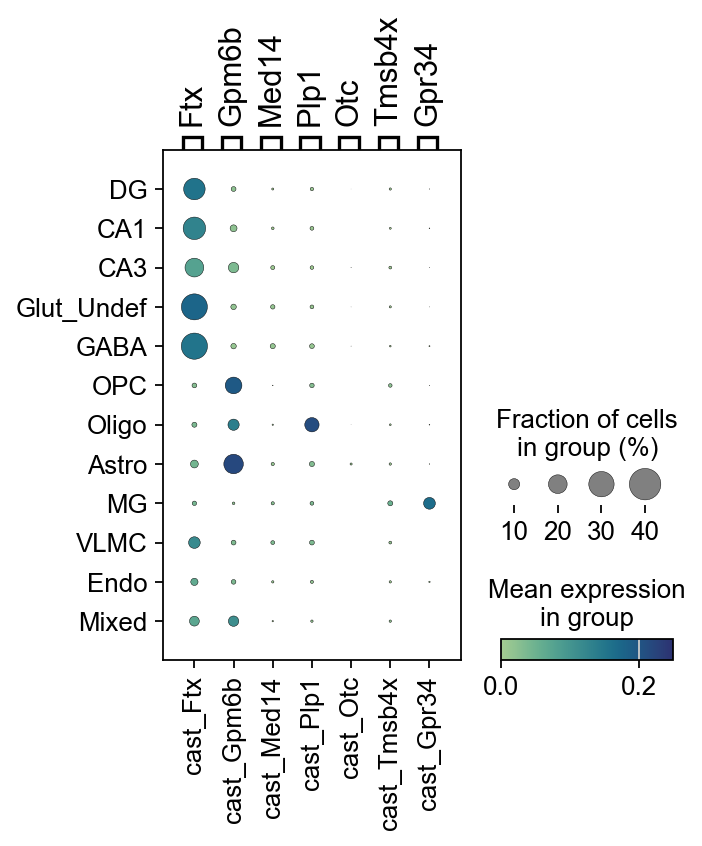

In [321]:
#plot genes that increase escape with aging - old cell populations
sc.pl.dotplot(chrx_adata_o, Escinci, groupby="cell_type", categories_order= ['DG', 'CA1', 'CA3', 'Glut_Undef', 'GABA', 'OPC', "Oligo", "Astro", "MG", "VLMC", "Endo", "Mixed"], dot_max=0.4, vmax=.25,  cmap='crest', save="chrx_adata_o.pdf")

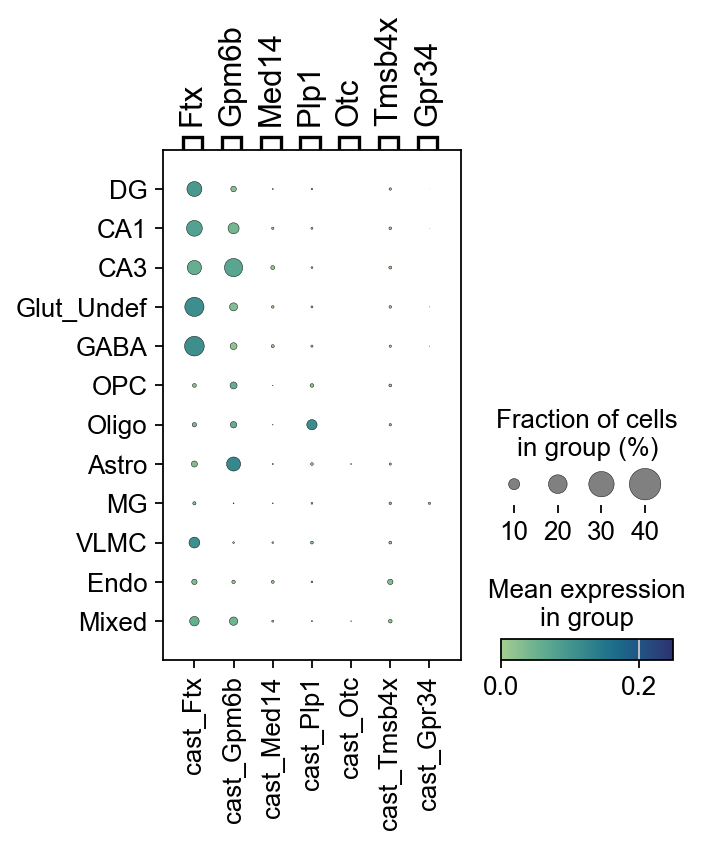

In [322]:
#plot genes that increase escape with aging - young cell populations
sc.pl.dotplot(chrx_adata_y, Escinci, groupby="cell_type", categories_order= ['DG', 'CA1', 'CA3', 'Glut_Undef', 'GABA', 'OPC', "Oligo", "Astro", "MG", "VLMC", "Endo", "Mixed"],  dot_max=0.4, vmax=.25,   cmap='crest', save="chrx_adata_y.pdf")

In [323]:
#genes that loose escape with aging 
Escdeci = {
    "Pak3": [ "cast_Pak3"],
    "Dcx": [ "cast_Dcx"],
    "Tsc22d3": [ "cast_Tsc22d3"],
    "Bex1": [ "cast_Bex1"],
    "Rragb": [ "cast_Rragb"],
    "Tspyl2": [ "cast_Tspyl2"],
    "Mid2": ["cast_Mid2"],
    "Gemin8": ["cast_Gemin8"],
    "Gpr173": [ "cast_Gpr173"],
    "Stag2": [ "cast_Stag2"],
    "Acsl4": [ "cast_Acsl4"],
    "Tmem35a": [ "cast_Tmem35a"],
   "Gpm6b": [ "cast_Gpm6b"],
    "Glra2": [ "cast_Glra2"],
    "Shroom2": [ "cast_Shroom2"],
    "Msl3": [ "cast_Msl3"],
    "Rbm3": [ "cast_Rbm3"],
    "Atp7a": ["cast_Atp7a"],
    "Smarca1": ["cast_Smarca1"],
    "Rpl36a": [ "cast_Rpl36a"],
    "Rps6ka3": [ "cast_Rps6ka3"],
    "Gm6938": [ "cast_Gm6938"],
    "Morc4": ["cast_Morc4"],
    "Nox1": ["cast_Nox1"],
    "Gla": [ "cast_Gla"],
    "Rbm41": [ "cast_Rbm41"],
    "Prps2": ["cast_Prps2"],
    "Syap1": [ "cast_Syap1"],
    "Armcx6": [ "cast_Armcx6"],
    "Dock11": [ "cast_Dock11"]
}


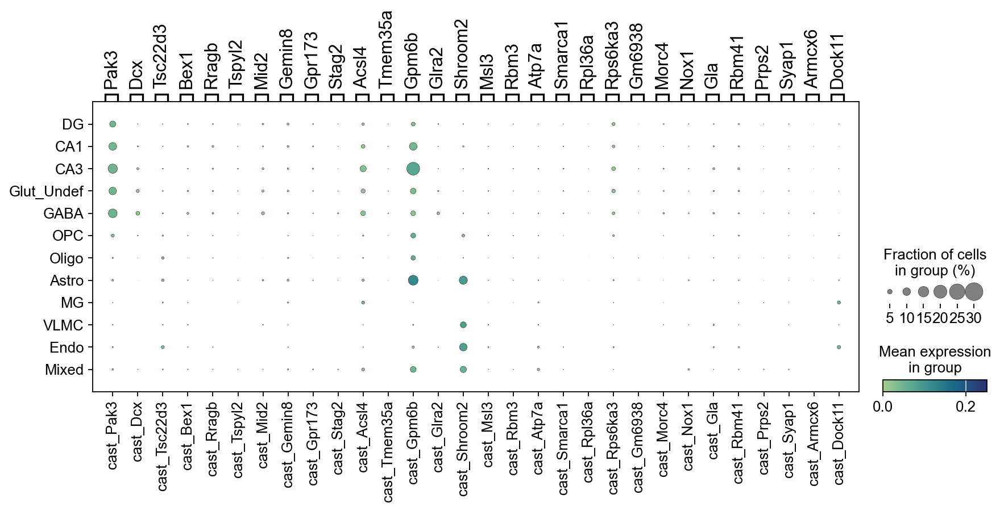

In [324]:
#plot genes that loose escape with aging - young cell populations
sc.pl.dotplot(chrx_adata_y, Escdeci, groupby="cell_type", categories_order= ['DG', 'CA1', 'CA3', 'Glut_Undef', 'GABA', 'OPC', "Oligo", "Astro", "MG", "VLMC", "Endo", "Mixed"],  dot_max=0.3, vmax=.25, cmap='crest', save="Escdeciy.pdf")

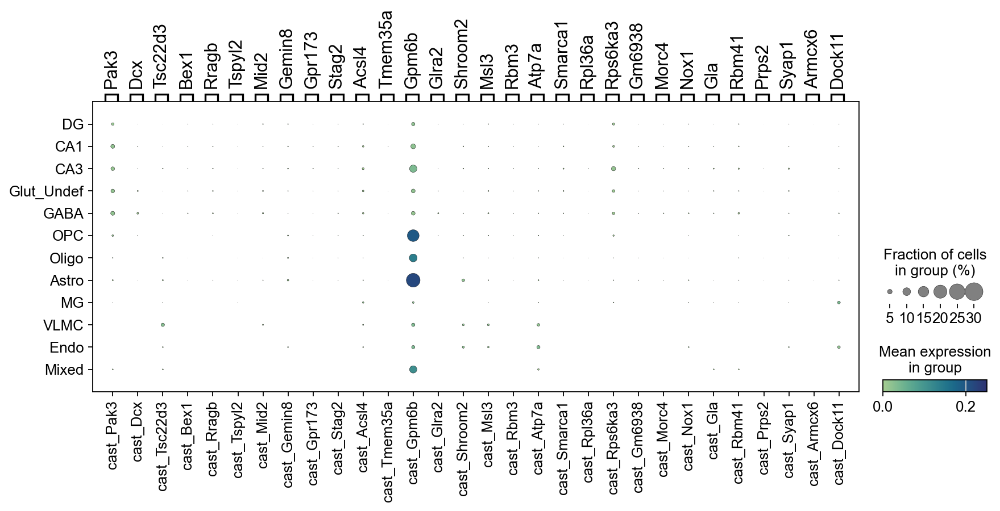

In [325]:
#plot genes that loose escape with aging - old cell populations
sc.pl.dotplot(chrx_adata_o, Escdeci, groupby="cell_type", categories_order= ['DG', 'CA1', 'CA3', 'Glut_Undef', 'GABA', 'OPC', "Oligo", "Astro", "MG", "VLMC", "Endo", "Mixed"],  dot_max=0.3, vmax=.25,  cmap='crest', save="Escdecio.pdf")

In [326]:
#genes that are age-induced escapees 

oldnewi = {
    "Plp1": ["cast_Plp1"],
    "1810030O07Rik": ["cast_1810030O07Rik"],
    "Nhsl2": ["cast_Nhsl2"],
    "Med14": ["cast_Med14"],

    "Gpr34": ["cast_Gpr34"],
    "Pdzd11": ["cast_Pdzd11"],
    "Atp7a": ["cast_Atp7a"],

    "Sat1": ["cast_Sat1"],
    "Otud5": ["cast_Otud5"],

    "Slc35a2": ["cast_Slc35a2"],
    "Srpk3": ["cast_Srpk3"],
        "Syap1": ["cast_Syap1"],

    "Gpkow": ["cast_Gpkow"],
    "Gria3": ["cast_Gria3"],
    "Ocrl": ["cast_Ocrl"],
    "Ofd1": ["cast_Ofd1"],
    "Gm15232": ["cast_Gm15232"],
    "Iqsec2": ["cast_Iqsec2"],
 
}


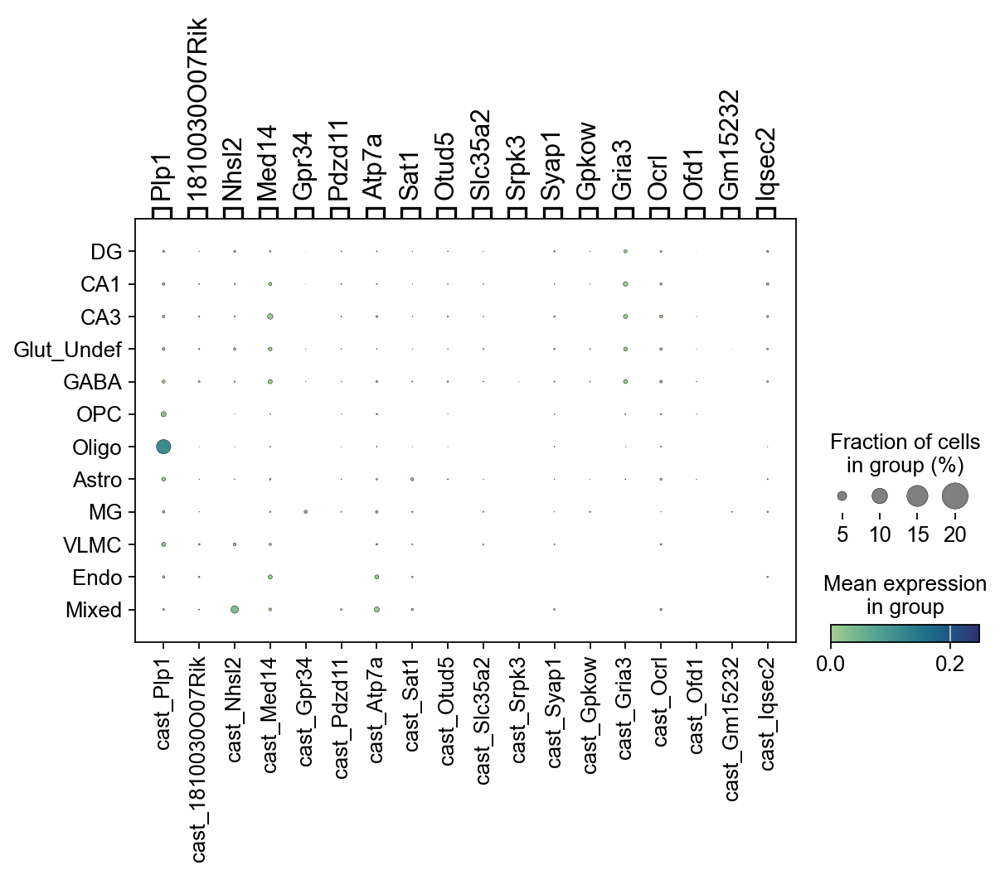

In [327]:
#plot genes that are age-induced escapees - young cell populations
sc.pl.dotplot(chrx_adata_y, oldnewi, groupby="cell_type", categories_order= ['DG', 'CA1', 'CA3', 'Glut_Undef', 'GABA', 'OPC', "Oligo", "Astro", "MG", "VLMC", "Endo", "Mixed"], cmap='crest', dot_max=.2, vmax=0.25, save="oldnewiy.pdf")

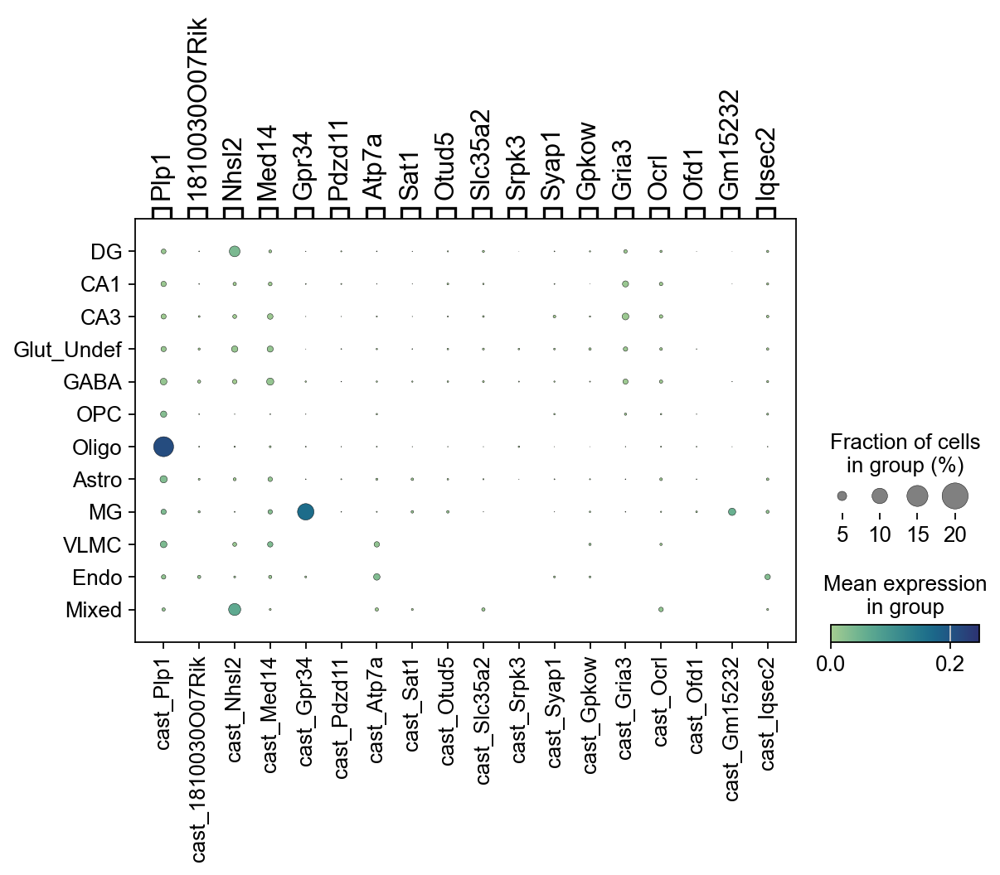

In [328]:
#plot genes that are age-induced escapees - old cell populations
sc.pl.dotplot(chrx_adata_o, oldnewi, groupby="cell_type", categories_order= ['DG', 'CA1', 'CA3', 'Glut_Undef', 'GABA', 'OPC', "Oligo", "Astro", "MG", "VLMC", "Endo", "Mixed"], dot_max=.2, vmax=0.25, cmap='crest', save="oldnewio.pdf")

In [329]:
# top genes from each escapee group 
top = {

       "Pak3": [ "cast_Pak3"],
    "Dcx": [ "cast_Dcx"],
    "Tsc22d3": [ "cast_Tsc22d3"],
    "Bex1": [ "cast_Bex1"],
    "Rragb": [ "cast_Rragb"],
    "Tspyl2": [ "cast_Tspyl2"],
    "Mid2": ["cast_Mid2"],
    "Gemin8": ["cast_Gemin8"],
    "Gpr173": [ "cast_Gpr173"],
    "Stag2": [ "cast_Stag2"],
    "Acsl4": [ "cast_Acsl4"],
    "Tmem35a": [ "cast_Tmem35a"],
    "Glra2": [ "cast_Glra2"],
    "Shroom2": [ "cast_Shroom2"],
    "Msl3": [ "cast_Msl3"],
    "Rbm3": [ "cast_Rbm3"],
    "Smarca1": ["cast_Smarca1"],
    "Rpl36a": [ "cast_Rpl36a"],
    "Rps6ka3": [ "cast_Rps6ka3"],
    "Gm6938": [ "cast_Gm6938"],
    "Morc4": ["cast_Morc4"],
    "Nox1": ["cast_Nox1"],
            "Gla": ["cast_Gla"],

    "Rbm41": [ "cast_Rbm41"],
    "Prps2": ["cast_Prps2"],
    "Armcx6": [ "cast_Armcx6"],
    "Dock11": [ "cast_Dock11"], 

        "Ftx": ["cast_Ftx"],
    "Plp1": ["cast_Plp1"],
    "1810030O07Rik": ["cast_1810030O07Rik"],
    "Nhsl2": ["cast_Nhsl2"],
    "Gpr34": ["cast_Gpr34"],
    "Pdzd11": ["cast_Pdzd11"],
    "Sat1": ["cast_Sat1"],
    "Otud5": ["cast_Otud5"],
    "Slc35a2": ["cast_Slc35a2"],
    "Srpk3": ["cast_Srpk3"],
    "Gpkow": ["cast_Gpkow"],
    "2010308F09Rik": ["cast_2010308F09Rik"],
    "Gria3": ["cast_Gria3"],
    "Ocrl": ["cast_Ocrl"],
    "Ofd1": ["cast_Ofd1"],
    "Gm15232": ["cast_Gm15232"],
    "Iqsec2": ["cast_Iqsec2"],
     "Med14": ["cast_Med14"],
    "Atp7a": ["cast_Atp7a"],
    "Gpm6b": ["cast_Gpm6b"],
    "Syap1": [ "cast_Syap1"], 
}



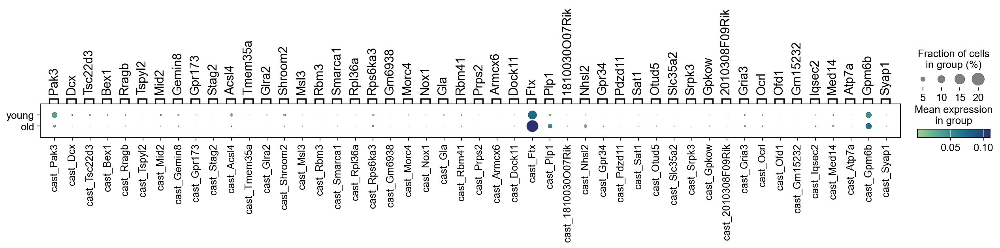

In [330]:
#top genes from each escapee group 
sc.pl.dotplot(adata, top, groupby="age", categories_order=["young", "old"], cmap='crest', save="top.pdf")

In [331]:
# young old expression by cell type 

In [332]:
#Rank x chr genes, rank all genes, sum of expression in young cells, sum of expression in old cells --Dentate Gyrus 
DGx = chrx_adata[chrx_adata.obs['cell_type'].isin(["DG"])]
sc.tl.rank_genes_groups(DGx, groupby="age", use_raw=False)
DGx = sc.get.rank_genes_groups_df(DGx, group="old")
DGx.to_csv("DGx_old1o12.csv")

DG = adata[adata.obs['cell_type'].isin(["DG"])]
sc.tl.rank_genes_groups(DG, groupby="age", use_raw=False)
DG = sc.get.rank_genes_groups_df(DG, group="old")

DGxy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin(["DG"])]
DGxy = DGxy.copy()
DGxy = DGxy.to_df()
DGxy = DGxy.transpose()
DGxy['sum'] = DGxy.sum(numeric_only=True, axis=1)
DGxy = DGxy['sum']
DGxy.to_csv("DGxy2o12.csv")


DGxo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin(["DG"])]
DGxo = DGxo.copy()
DGxo = DGxo.to_df()
DGxo = DGxo.transpose()
DGxo['sum'] = DGxo.sum(numeric_only=True, axis=1)
DGxo = DGxo['sum']
DGxo.to_csv("DGxo2o12.csv")

/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


In [333]:
#mean of expression in young cells, mean of expression in old cells --Dentate Gyrus 
DGxy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin(["DG"])]
DGxy = DGxy.copy()
DGxy = DGxy.to_df()
DGxy = DGxy.transpose()
DGxy['mean'] = DGxy.mean(numeric_only=True, axis=1)
DGxy = DGxy['mean']
DGxy.to_csv("DGxy2om12.csv")


DGxo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin(["DG"])]
DGxo = DGxo.copy()
DGxo = DGxo.to_df()
DGxo = DGxo.transpose()
DGxo['mean'] = DGxo.mean(numeric_only=True, axis=1)
DGxo = DGxo['mean']
DGxo.to_csv("DGxo2om12.csv")



In [334]:
#Rank x chr genes, rank all genes, sum of expression in young cells, sum of expression in old cells --Astrocytes 
Astrox = chrx_adata[chrx_adata.obs['cell_type'].isin(['Astro'])]
sc.tl.rank_genes_groups(Astrox, groupby="age", use_raw=False)
Astrox = sc.get.rank_genes_groups_df(Astrox, group="old")
Astrox.to_csv("Astrox_old1o12.csv")

Astro = adata[adata.obs['cell_type'].isin(["Astro"])]
sc.tl.rank_genes_groups(Astro, groupby="age", use_raw=False)
Astro = sc.get.rank_genes_groups_df(Astro, group="old")

Astroxy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin(['Astro'])]
Astroxy = Astroxy.copy()
Astroxy = Astroxy.to_df()
Astroxy = Astroxy.transpose()
Astroxy['sum'] = Astroxy.sum(numeric_only=True, axis=1)
Astroxy = Astroxy['sum']
Astroxy.to_csv("Astroxy2o12.csv")


Astroxo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin(['Astro'])]
Astroxo = Astroxo.copy()
Astroxo = Astroxo.to_df()
Astroxo = Astroxo.transpose()
Astroxo['sum'] = Astroxo.sum(numeric_only=True, axis=1)
Astroxo = Astroxo['sum']
Astroxo.to_csv("Astroxo2o12.csv")

/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


In [335]:
#mean of expression in young cells, mean of expression in old cells --Astrocytes 
Astroxy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin(["Astro"])]
Astroxy = Astroxy.copy()
Astroxy = Astroxy.to_df()
Astroxy = Astroxy.transpose()
Astroxy['mean'] = Astroxy.mean(numeric_only=True, axis=1)
Astroxy = Astroxy['mean']
Astroxy.to_csv("Astroxy2om12.csv")


Astroxo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin(["Astro"])]
Astroxo = Astroxo.copy()
Astroxo = Astroxo.to_df()
Astroxo = Astroxo.transpose()
Astroxo['mean'] = Astroxo.mean(numeric_only=True, axis=1)
Astroxo = Astroxo['mean']
Astroxo.to_csv("Astroxo2om12.csv")



In [336]:
#Rank x chr genes, rank all genes, sum of expression in young cells, sum of expression in old cells --Oligodendrocytes  
Oligox = chrx_adata[chrx_adata.obs['cell_type'].isin(["Oligo"])]
sc.tl.rank_genes_groups(Oligox, groupby="age", use_raw=False)
Oligox = sc.get.rank_genes_groups_df(Oligox, group="old")
Oligox.to_csv("Oligox_old1o12.csv")

Oligo = adata[adata.obs['cell_type'].isin(["Oligo"])]
sc.tl.rank_genes_groups(Oligo, groupby="age", use_raw=False)
Oligo = sc.get.rank_genes_groups_df(Oligo, group="old")



Oligoxy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin(["Oligo"])]
Oligoxy = Oligoxy.copy()
Oligoxy = Oligoxy.to_df()
Oligoxy = Oligoxy.transpose()
Oligoxy['sum'] = Oligoxy.sum(numeric_only=True, axis=1)
Oligoxy = Oligoxy['sum']
Oligoxy.to_csv("Oligoxy2o12.csv")


Oligoxo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin(["Oligo"])]
Oligoxo = Oligoxo.copy()
Oligoxo = Oligoxo.to_df()
Oligoxo = Oligoxo.transpose()
Oligoxo['sum'] = Oligoxo.sum(numeric_only=True, axis=1)
Oligoxo = Oligoxo['sum']
Oligoxo.to_csv("Oligoxo2o12.csv")

/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


In [337]:
#mean of expression in young cells, mean of expression in old cells --Oligodendrocytes 
Oligoxy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin(["Oligo"])]
Oligoxy = Oligoxy.copy()
Oligoxy = Oligoxy.to_df()
Oligoxy = Oligoxy.transpose()
Oligoxy['mean'] = Oligoxy.mean(numeric_only=True, axis=1)
Oligoxy = Oligoxy['mean']
Oligoxy.to_csv("Oligoxy2om12.csv")


Oligoxo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin(["Oligo"])]
Oligoxo = Oligoxo.copy()
Oligoxo = Oligoxo.to_df()
Oligoxo = Oligoxo.transpose()
Oligoxo['mean'] = Oligoxo.mean(numeric_only=True, axis=1)
Oligoxo = Oligoxo['mean']
Oligoxo.to_csv("Oligoxo2om12.csv")

In [338]:
#Rank x chr genes, rank all genes, sum of expression in young cells, sum of expression in old cells --GABA neurons   
GABAx = chrx_adata[chrx_adata.obs['cell_type'].isin(['GABA' ])]
sc.tl.rank_genes_groups(GABAx, groupby="age", use_raw=False)
GABAx = sc.get.rank_genes_groups_df(GABAx, group="old")
GABAx.to_csv("GABAx_old1o12.csv")


GABA = adata[adata.obs['cell_type'].isin(["GABA"])]
sc.tl.rank_genes_groups(GABA, groupby="age", use_raw=False)
GABA = sc.get.rank_genes_groups_df(GABA, group="old")


GABAxy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin(['GABA' ])]
GABAxy = GABAxy.copy()
GABAxy = GABAxy.to_df()
GABAxy = GABAxy.transpose()
GABAxy['sum'] = GABAxy.sum(numeric_only=True, axis=1)
GABAxy = GABAxy['sum']
GABAxy.to_csv("GABAxy2o12.csv")


GABAxo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin(['GABA' ])]
GABAxo = GABAxo.copy()
GABAxo = GABAxo.to_df()
GABAxo = GABAxo.transpose()
GABAxo['sum'] = GABAxo.sum(numeric_only=True, axis=1)
GABAxo = GABAxo['sum']
GABAxo.to_csv("GABAxo2o12.csv")

/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


In [339]:
#mean of expression in young cells, mean of expression in old cells --GABA neurons 
GABAxy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin(["GABA"])]
GABAxy = GABAxy.copy()
GABAxy = GABAxy.to_df()
GABAxy = GABAxy.transpose()
GABAxy['mean'] = GABAxy.mean(numeric_only=True, axis=1)
GABAxy = GABAxy['mean']
GABAxy.to_csv("GABAxy2om12.csv")


GABAxo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin(["GABA"])]
GABAxo = GABAxo.copy()
GABAxo = GABAxo.to_df()
GABAxo = GABAxo.transpose()
GABAxo['mean'] = GABAxo.mean(numeric_only=True, axis=1)
GABAxo = GABAxo['mean']
GABAxo.to_csv("GABAxo2om12.csv")

In [340]:
#Rank x chr genes, rank all genes, sum of expression in young cells, sum of expression in old cells --CA3 neurons 
ca3x = chrx_adata[chrx_adata.obs['cell_type'].isin(['CA3'])]
sc.tl.rank_genes_groups(ca3x, groupby="age", use_raw=False)
ca3x = sc.get.rank_genes_groups_df(ca3x, group="old")
ca3x.to_csv("ca3x_old1o12.csv")


CA3 = adata[adata.obs['cell_type'].isin(["CA3"])]
sc.tl.rank_genes_groups(CA3, groupby="age", use_raw=False)
CA3 = sc.get.rank_genes_groups_df(CA3, group="old")


ca3xy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin(['CA3'])]
ca3xy = ca3xy.copy()
ca3xy = ca3xy.to_df()
ca3xy = ca3xy.transpose()
ca3xy['sum'] = ca3xy.sum(numeric_only=True, axis=1)
ca3xy = ca3xy['sum']
ca3xy.to_csv("ca3xy2o12.csv")


ca3xo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin(['CA3'])]
ca3xo = ca3xo.copy()
ca3xo = ca3xo.to_df()
ca3xo = ca3xo.transpose()
ca3xo['sum'] = ca3xo.sum(numeric_only=True, axis=1)
ca3xo = ca3xo['sum']
ca3xo.to_csv("ca3xo2o12.csv")


/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


In [341]:
#mean of expression in young cells, mean of expression in old cells --CA3 neurons 
CA3xy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin(["CA3"])]
CA3xy = CA3xy.copy()
CA3xy = CA3xy.to_df()
CA3xy = CA3xy.transpose()
CA3xy['mean'] = CA3xy.mean(numeric_only=True, axis=1)
CA3xy = CA3xy['mean']
CA3xy.to_csv("CA3xy2om12.csv")


CA3xo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin(["CA3"])]
CA3xo = CA3xo.copy()
CA3xo = CA3xo.to_df()
CA3xo = CA3xo.transpose()
CA3xo['mean'] = CA3xo.mean(numeric_only=True, axis=1)
CA3xo = CA3xo['mean']
CA3xo.to_csv("CA3xo2om12.csv")

In [342]:
#Rank x chr genes, rank all genes, sum of expression in young cells, sum of expression in old cells --Undef Glut neurons   
Glutx = chrx_adata[chrx_adata.obs['cell_type'].isin([
'Glut_Undef' ])]
sc.tl.rank_genes_groups(Glutx, groupby="age", use_raw=False)
Glutx = sc.get.rank_genes_groups_df(Glutx, group="old")
Glutx.to_csv("Glutx_old1o12.csv")

Glut = adata[adata.obs['cell_type'].isin(["Glut_Undef"])]
sc.tl.rank_genes_groups(Glut, groupby="age", use_raw=False)
Glut = sc.get.rank_genes_groups_df(Glut, group="old")


Glutxy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin([
'Glut_Undef' ])]
Glutxy = Glutxy.copy()
Glutxy = Glutxy.to_df()
Glutxy = Glutxy.transpose()
Glutxy['sum'] = Glutxy.sum(numeric_only=True, axis=1)
Glutxy = Glutxy['sum']
Glutxy.to_csv("Glutxy2o12.csv")


Glutxo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin([
'Glut_Undef' ])]
Glutxo = Glutxo.to_df()
Glutxo = Glutxo.transpose()
Glutxo['sum'] = Glutxo.sum(numeric_only=True, axis=1)
Glutxo = Glutxo['sum']
Glutxo.to_csv("Glutxo2o12.csv")


/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


In [343]:
#mean of expression in young cells, mean of expression in old cells --Undef Glut neurons 

Glut_Undefxy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin(["Glut_Undef"])]
Glut_Undefxy = Glut_Undefxy.copy()
Glut_Undefxy = Glut_Undefxy.to_df()
Glut_Undefxy = Glut_Undefxy.transpose()
Glut_Undefxy['mean'] = Glut_Undefxy.mean(numeric_only=True, axis=1)
Glut_Undefxy = Glut_Undefxy['mean']
Glut_Undefxy.to_csv("Glut_Undefxy2om12.csv")


Glut_Undefxo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin(["Glut_Undef"])]
Glut_Undefxo = Glut_Undefxo.copy()
Glut_Undefxo = Glut_Undefxo.to_df()
Glut_Undefxo = Glut_Undefxo.transpose()
Glut_Undefxo['mean'] = Glut_Undefxo.mean(numeric_only=True, axis=1)
Glut_Undefxo = Glut_Undefxo['mean']
Glut_Undefxo.to_csv("Glut_Undefxo2om12.csv")

In [344]:
#Rank x chr genes, rank all genes, sum of expression in young cells, sum of expression in old cells --CA1 neurons   
ca1x = chrx_adata[chrx_adata.obs['cell_type'].isin([                    
                     'CA1'])]
sc.tl.rank_genes_groups(ca1x, groupby="age", use_raw=False)
ca1x = sc.get.rank_genes_groups_df(ca1x, group="old")
ca1x.to_csv("ca1x_old1o12.csv")

CA1 = adata[adata.obs['cell_type'].isin(["CA1"])]
sc.tl.rank_genes_groups(CA1, groupby="age", use_raw=False)
CA1 = sc.get.rank_genes_groups_df(CA1, group="old")



ca1xy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin([                    
                     'CA1'])]
ca1xy = ca1xy.copy()
ca1xy = ca1xy.to_df()
ca1xy = ca1xy.transpose()
ca1xy['sum'] = ca1xy.sum(numeric_only=True, axis=1)
ca1xy = ca1xy['sum']
ca1xy.to_csv("ca1xy2o12.csv")


ca1xo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin([                    
                     'CA1'])]
ca1xo = ca1xo.copy()
ca1xo = ca1xo.to_df()
ca1xo = ca1xo.transpose()
ca1xo['sum'] = ca1xo.sum(numeric_only=True, axis=1)
ca1xo = ca1xo['sum']
ca1xo.to_csv("ca1xo2o12.csv")


/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


In [345]:
#mean of expression in young cells, mean of expression in old cells --CA1 neurons 

CA1xy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin(["CA1"])]
CA1xy = CA1xy.copy()
CA1xy = CA1xy.to_df()
CA1xy = CA1xy.transpose()
CA1xy['mean'] = CA1xy.mean(numeric_only=True, axis=1)
CA1xy = CA1xy['mean']
CA1xy.to_csv("CA1xy2om12.csv")


CA1xo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin(["CA1"])]
CA1xo = CA1xo.copy()
CA1xo = CA1xo.to_df()
CA1xo = CA1xo.transpose()
CA1xo['mean'] = CA1xo.mean(numeric_only=True, axis=1)
CA1xo = CA1xo['mean']
CA1xo.to_csv("CA1xo2om12.csv")

In [346]:
#Rank x chr genes, rank all genes, sum of expression in young cells, sum of expression in old cells --OPCs   

OPCx = chrx_adata[chrx_adata.obs['cell_type'].isin([                    
                     'OPC'])]
sc.tl.rank_genes_groups(OPCx, groupby="age", use_raw=False)
OPCx = sc.get.rank_genes_groups_df(OPCx, group="old")
OPCx.to_csv("OPCx_old1o12.csv")

OPC = adata[adata.obs['cell_type'].isin(["OPC"])]
sc.tl.rank_genes_groups(OPC, groupby="age", use_raw=False)
OPC = sc.get.rank_genes_groups_df(OPC, group="old")


OPCxy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin([                    
                     'OPC'])]
OPCxy = OPCxy.copy()
OPCxy = OPCxy.to_df()
OPCxy = OPCxy.transpose()
OPCxy['sum'] = OPCxy.sum(numeric_only=True, axis=1)
OPCxy = OPCxy['sum']
OPCxy.to_csv("OPCxy2o12.csv")


OPCxo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin([                    
                     'OPC'])]
OPCxo = OPCxo.copy()
OPCxo = OPCxo.to_df()
OPCxo = OPCxo.transpose()
OPCxo['sum'] = OPCxo.sum(numeric_only=True, axis=1)
OPCxo = OPCxo['sum']
OPCxo.to_csv("OPCxo2o12.csv")


/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


In [347]:
#mean of expression in young cells, mean of expression in old cells --OPCs 

OPCxy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin(["OPC"])]
OPCxy = OPCxy.copy()
OPCxy = OPCxy.to_df()
OPCxy = OPCxy.transpose()
OPCxy['mean'] = OPCxy.mean(numeric_only=True, axis=1)
OPCxy = OPCxy['mean']
OPCxy.to_csv("OPCxy2om12.csv")


OPCxo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin(["OPC"])]
OPCxo = OPCxo.copy()
OPCxo = OPCxo.to_df()
OPCxo = OPCxo.transpose()
OPCxo['mean'] = OPCxo.mean(numeric_only=True, axis=1)
OPCxo = OPCxo['mean']
OPCxo.to_csv("OPCxo2om12.csv")

In [348]:
#Rank x chr genes, rank all genes, sum of expression in young cells, sum of expression in old cell --Microglia 

MGx = chrx_adata[chrx_adata.obs['cell_type'].isin(["MG"])]
sc.tl.rank_genes_groups(MGx, groupby="age", use_raw=False)
MGx = sc.get.rank_genes_groups_df(MGx, group="old")
MGx.to_csv("MGx_old1o12.csv")

MG = adata[adata.obs['cell_type'].isin(["MG"])]
sc.tl.rank_genes_groups(MG, groupby="age", use_raw=False)
MG = sc.get.rank_genes_groups_df(MG, group="old")



MGxy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin(["MG"])]
MGxy = MGxy.copy()
MGxy = MGxy.to_df()
MGxy = MGxy.transpose()
MGxy['mean'] = MGxy.mean(numeric_only=True, axis=1)
MGxy = MGxy['mean']
MGxy.to_csv("MGxy2om12.csv")


MGxo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin(["MG"])]
MGxo = MGxo.copy()
MGxo = MGxo.to_df()
MGxo = MGxo.transpose()
MGxo['mean'] = MGxo.mean(numeric_only=True, axis=1)
MGxo = MGxo['mean']
MGxo.to_csv("MGxo2om12.csv")

/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


In [349]:
#mean of expression in young cells, mean of expression in old cells - MG 

MGxy = chrx_adata_y[chrx_adata_y.obs['cell_type'].isin(["MG"])]
MGxy = MGxy.copy()
MGxy = MGxy.to_df()
MGxy = MGxy.transpose()
MGxy['mean'] = MGxy.mean(numeric_only=True, axis=1)
MGxy = MGxy['mean']
MGxy.to_csv("MGxy2om12.csv")

MGxo = chrx_adata_o[chrx_adata_o.obs['cell_type'].isin(["MG"])]
MGxo = MGxo.copy()
MGxo = MGxo.to_df()
MGxo = MGxo.transpose()
MGxo['mean'] = MGxo.mean(numeric_only=True, axis=1)
MGxo = MGxo['mean']
MGxo.to_csv("MGxo2om12.csv")

In [350]:
# sum of expression in ALL old cells
chrx_adata_o = chrx_adata_o.copy()
chrx_adata_o = chrx_adata_o.to_df()
chrx_adata_o = chrx_adata_o.transpose()
chrx_adata_o['sum'] = chrx_adata_o.sum(numeric_only=True, axis=1)
chrx_adata_oa = chrx_adata_o['sum']
chrx_adata_oa.to_csv("chrx_adata_sumo5o12.csv")

In [351]:
# sum of expression in ALL young cells
chrx_adata_y = chrx_adata_y.copy()
chrx_adata_y = chrx_adata_y.to_df()
chrx_adata_y = chrx_adata_y.transpose()
chrx_adata_y['sum'] = chrx_adata_y.sum(numeric_only=True, axis=1)
chrx_adata_ya = chrx_adata_y['sum']
chrx_adata_ya.to_csv("chrx_adata_sumy3o12.csv")

In [352]:
#reset young and old matrixes 
chrx_adata_o = chrx_adata[chrx_adata.obs.age == 'old']
chrx_adata_y = chrx_adata[chrx_adata.obs.age == 'young']

In [353]:
# mean of expression in ALL old cells
chrx_adata_o = chrx_adata_o.copy()
chrx_adata_o = chrx_adata_o.to_df()
chrx_adata_o = chrx_adata_o.transpose()
chrx_adata_o['mean'] = chrx_adata_o.mean(numeric_only=True, axis=1)
chrx_adata_oa = chrx_adata_o['mean']
chrx_adata_oa.to_csv("chrx_adata_meano12.csv")

In [354]:
# mean of expression in ALL young cells
chrx_adata_y = chrx_adata_y.copy()
chrx_adata_y = chrx_adata_y.to_df()
chrx_adata_y = chrx_adata_y.transpose()
chrx_adata_y['mean'] = chrx_adata_y.mean(numeric_only=True, axis=1)
chrx_adata_ya = chrx_adata_y['mean']
chrx_adata_ya.to_csv("chrx_adata_meany12.csv")

In [355]:
# begin prep for GO Term Analysis 
#adapted from: https://github.com/mousepixels/sanbomics_scripts/blob/main/GO_in_python.ipynb


In [356]:
adata.obs

,age,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,...,leiden,leiden_res_0.02,leiden_res_0.05,leiden_res_0.10,leiden_res_0.30,leiden_res_0.50,leiden_res_1.00,leiden_res_1.50,leiden_res_2.00,cell_type
AAACCCAAGAGGGTGG-1,old,1,3282,8.096513,6080.0,8.712924,17.894737,24.029605,32.253289,46.710526,...,0,0,0,0,0,Astro_1,0,0,0,Astro
AAACCCAAGCGAAACC-1,old,1,2246,7.717351,3954.0,8.282736,22.483561,29.489125,38.340921,54.602934,...,2,1,1,1,1,DG,1,1,1,DG
AAACCCACAACAGCCC-1,old,1,3937,8.278428,8773.0,9.079548,18.648125,26.296592,35.962613,50.780805,...,5,2,3,2,4,GABA_1,7,4,6,GABA
AAACCCACACACCGCA-1,old,1,2096,7.648263,3456.0,8.148156,20.457176,27.372685,36.776620,53.819444,...,4,1,1,1,1,DG,3,3,2,DG
AAACCCACACGGCACT-1,old,1,1344,7.204149,1970.0,7.586296,22.081218,29.441624,39.593909,57.157360,...,1,0,0,0,0,Astro_1,8,7,7,Astro
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTTTCCATT-8,old,8,1142,7.041412,1609.0,7.383989,20.820385,28.527035,40.957116,60.099441,...,11,3,4,3,5,Oligo_1,9,9,8,Oligo
TTTGTTGTCCGCCTAT-8,old,8,4838,8.484463,13351.0,9.499421,22.844731,31.076324,40.431428,53.688862,...,19,2,2,6,9,Glut_1,14,17,15,Glut_Undef
TTTGTTGTCGCTTGAA-8,old,8,2451,7.804659,4892.0,8.495561,22.935405,30.621423,40.412919,55.948487,...,2,1,1,1,1,DG,1,1,1,DG
TTTGTTGTCTATCACT-8,old,8,3742,8.227643,9820.0,9.192278,25.763747,34.175153,43.645621,57.525458,...,13,2,2,5,2,CA1,4,18,19,CA1


In [357]:
#compare cell types
sc.tl.rank_genes_groups(adata, groupby="cell_type", method="wilcoxon")

In [358]:
#organize results 
results = adata.uns['rank_genes_groups']
out = np.array([[0,0,0,0,0]])
for group in results['names'].dtype.names:
    out = np.vstack((out, np.vstack((results['names'][group],
                                         results['scores'][group],
                                         results['pvals_adj'][group],
                                         results['logfoldchanges'][group],
                                         np.array([group] * len(results['names'][group])).astype('object'))).T))
markers = pd.DataFrame(out[1:], columns = ['Gene', 'scores', 'pval_adj', 'lfc', 'cluster'])
adata.uns['markers'] = markers #save marker df to uns

In [359]:
##markers from rankings 
ec_markers = adata.uns['markers']

In [360]:
# X chromsone GO Terms
ec_markers["Gene_type"] = ec_markers["Gene"].apply(lambda gene: "X" if gene in chrx_genes else "A")

In [361]:
# Define the cluster types
neuro_clusters = ["CA1", "CA3", "DG", "Glut_Undef", "GABA"]
glial_clusters = ["Oligo", "OPC", "Astro", "MG"]

# Adding column based on cluster 
def determine_type(cluster): 
    if cluster in neuro_clusters:
      return "Neuro"
    elif cluster in glial_clusters:
      return "Glial"
    else:
      return "NA"
ec_markers["type"] = ec_markers["cluster"].apply(determine_type)

In [362]:
# capitalize genes 
ec_markers.loc[:, 'Gene'] = ec_markers['Gene'].str[5:].str.capitalize()

In [363]:
#show markers 
ec_markers

,Gene,scores,pval_adj,lfc,cluster,Gene_type,type
0,Slc1a2,131.938095,0.0,5.146632,Astro,A,Glial
1,Slc1a2,131.50502,0.0,5.163337,Astro,A,Glial
2,Gpc5,127.442085,0.0,5.959326,Astro,A,Glial
3,Gpc5,126.532776,0.0,5.804958,Astro,A,Glial
4,Slc1a3,120.090881,0.0,5.004549,Astro,A,Glial
...,...,...,...,...,...,...,...
562039,Lrp1b,-27.508114,0.0,-3.766229,VLMC,A,NA
562040,Csmd1,-28.074413,0.0,-4.081898,VLMC,A,NA
562041,Nkain2,-28.469194,0.0,-4.583332,VLMC,A,NA
562042,Cadm2,-28.543552,0.0,-3.209551,VLMC,A,NA


In [364]:
#significant markers -- Autosome 
Aec_markers_Astro = ec_markers[(ec_markers.cluster == 'Astro') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "A")]
Aec_markers_CA1 = ec_markers[(ec_markers.cluster == 'CA1') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "A")]
Aec_markers_CA3 = ec_markers[(ec_markers.cluster == 'CA3') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "A")]
Aec_markers_DG = ec_markers[(ec_markers.cluster == 'DG') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "A")]
Aec_markers_Glut_Undef = ec_markers[(ec_markers.cluster == 'Glut_Undef') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "A")]
Aec_markers_GABA = ec_markers[(ec_markers.cluster == 'GABA') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "A")]
Aec_markers_MG = ec_markers[(ec_markers.cluster == 'MG') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "A")]
Aec_markers_OPC = ec_markers[(ec_markers.cluster == 'OPC') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "A")]
Aec_markers_Oligo = ec_markers[(ec_markers.cluster == 'Oligo') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "A")]


In [365]:
#significant markers -- X chromosone 
Xec_markers_Astro = ec_markers[(ec_markers.cluster == 'Astro') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "X")]
Xec_markers_CA1 = ec_markers[(ec_markers.cluster == 'CA1') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "X")]
Xec_markers_CA3 = ec_markers[(ec_markers.cluster == 'CA3') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "X")]
Xec_markers_DG = ec_markers[(ec_markers.cluster == 'DG') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "X")]
Xec_markers_Glut_Undef = ec_markers[(ec_markers.cluster == 'Glut_Undef') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "X")]
Xec_markers_GABA = ec_markers[(ec_markers.cluster == 'GABA') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "X")]
Xec_markers_MG = ec_markers[(ec_markers.cluster == 'MG') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "X")]
Xec_markers_OPC = ec_markers[(ec_markers.cluster == 'OPC') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "X")]
Xec_markers_Oligo = ec_markers[(ec_markers.cluster == 'Oligo') & (ec_markers.pval_adj < 0.05) & ((ec_markers.lfc > .1) |  (ec_markers.lfc < -.1)) & (ec_markers.Gene_type == "X")]


In [366]:
#export Autosome marker genes by cell type 
Aec_markers_Astro.to_csv("Aec_markers_Astro12.csv")
Aec_markers_CA1.to_csv("Aec_markers_CA112.csv")
Aec_markers_CA3.to_csv("Aec_markers_CA312.csv")
Aec_markers_DG.to_csv("Aec_markers_DG12.csv")
Aec_markers_Glut_Undef.to_csv("Aec_markers_Glut_Undef12.csv")
Aec_markers_GABA.to_csv("Aec_markers_GABA12.csv")
Aec_markers_MG.to_csv("Aec_markers_MG12.csv")
Aec_markers_OPC.to_csv("Aec_markers_OPC12.csv")
Aec_markers_Oligo.to_csv("Aec_markers_Oligo12.csv")

In [367]:
#export X chr marker genes by cell type
Xec_markers_Astro.to_csv("Xec_markers_Astro12.csv")
Xec_markers_CA1.to_csv("Xec_markers_CA112.csv")
Xec_markers_CA3.to_csv("Xec_markers_CA312.csv")
Xec_markers_DG.to_csv("Xec_markers_DG12.csv")
Xec_markers_Glut_Undef.to_csv("Xec_markers_Glut_Undef12.csv")
Xec_markers_GABA.to_csv("Xec_markers_GABA12.csv")
Xec_markers_MG.to_csv("Xec_markers_MG12.csv")
Xec_markers_OPC.to_csv("Xec_markers_OPC12.csv")
Xec_markers_Oligo.to_csv("Xec_markers_Oligo12.csv")

In [368]:
## run in G:Profiler https://biit.cs.ut.ee/gprofiler/gost

In [369]:
# analyze and organize dataframes in excel 
#re import organized data -- autosome
GOA = pd.read_csv("/Users/margaretgadek/Dubal Lab Dropbox/Dubal Lab Team Folder/_Margaret/working figures/GO/CellA/20240904AGORank_Cell.csv")

In [370]:
GOA

,term,CA1,CA3,DG,Glut,gaba,MG,Oligo,OPC,Astro
0,synapse,24.597318,29.419166,30.974379,26.653624,30.060589,48.936156,21.158133,38.772275,24.532600
1,cell junction,21.876060,24.459504,30.194699,24.582488,30.675547,44.578004,19.223165,33.540415,20.889487
2,synaptic membrane,21.671453,24.764800,19.466781,NaN,25.265856,39.160346,17.485543,32.989931,NaN
3,postsynapse,21.311691,22.899120,18.448280,NaN,NaN,39.709025,NaN,26.744779,NaN
4,glutamatergic synapse,20.507644,NaN,25.906794,21.723571,NaN,35.545091,14.609737,28.711883,22.043677
5,monoatomic ion channel complex,18.805765,NaN,NaN,NaN,NaN,NaN,15.752968,NaN,NaN
6,monoatomic ion channel activity,17.725266,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,neuron projection,16.981896,23.139198,21.059430,NaN,23.880025,NaN,16.373145,27.317136,24.504737
8,gated channel activity,16.696291,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,postsynaptic membrane,16.378166,NaN,NaN,NaN,NaN,36.149920,15.654851,26.940632,NaN


In [371]:
#remove any blank rows 
#GOA = GOA[:-4]

In [372]:
#load programs to graph 
from matplotlib import cm
import seaborn as sns
import textwrap

In [373]:
pivot_tableA = GOA.set_index('term')

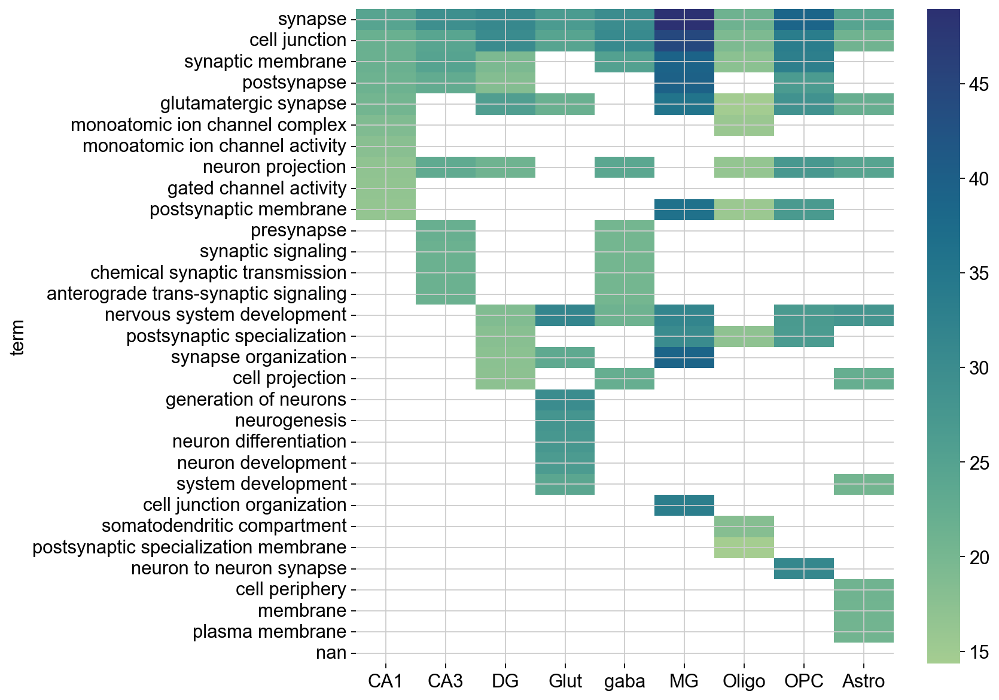

In [374]:
sns_plotA = sns.heatmap(pivot_tableA, cmap='crest', xticklabels=True, yticklabels=True)
plt.savefig('outputGOA.pdf')

In [375]:
# analyze and organize dataframes in excel 
#re import organized data  - X chr 
GOX = pd.read_csv("/Users/margaretgadek/Dubal Lab Dropbox/Dubal Lab Team Folder/_Margaret/working figures/GO/CellA/CellX/20240904XGORank_Cell.csv")

In [376]:
GOX

,term,CA1,CA3,DG,Glut,Gaba,MG,Oligo,OPC,Astro
0,synapse,7.844363,7.181479,8.467665,6.824810,6.212797,8.117261,7.213004,6.433705,8.252148
1,synapse organization,7.572116,7.595910,4.959969,6.062904,4.194345,9.427879,9.904564,7.095115,9.773353
2,cell junction,7.477468,8.282820,9.936428,7.178551,6.385198,10.264773,7.646122,6.620356,8.183615
3,cell junction organization,5.076947,4.959588,NaN,5.311940,NaN,7.596494,7.409426,5.672229,7.226837
4,neuron projection,4.963911,6.214418,4.630945,NaN,4.859947,NaN,NaN,4.049057,NaN
5,glutamatergic synapse,4.230811,NaN,NaN,NaN,NaN,NaN,NaN,3.651510,NaN
6,regulation of biological process,4.230100,NaN,4.833959,4.013695,4.514837,6.703112,NaN,NaN,8.069013
7,regulation of biological quality,3.986064,8.962463,NaN,4.363009,4.661740,6.673571,4.853960,3.801578,7.816145
8,axon,3.902631,6.552563,NaN,NaN,3.610283,NaN,NaN,NaN,NaN
9,biological regulation,3.763305,NaN,NaN,NaN,4.598153,6.357968,NaN,NaN,7.310020


In [377]:
#remove blank rows
GOX = GOX[:-1]

In [378]:
GOX

,term,CA1,CA3,DG,Glut,Gaba,MG,Oligo,OPC,Astro
0,synapse,7.844363,7.181479,8.467665,6.824810,6.212797,8.117261,7.213004,6.433705,8.252148
1,synapse organization,7.572116,7.595910,4.959969,6.062904,4.194345,9.427879,9.904564,7.095115,9.773353
2,cell junction,7.477468,8.282820,9.936428,7.178551,6.385198,10.264773,7.646122,6.620356,8.183615
3,cell junction organization,5.076947,4.959588,NaN,5.311940,NaN,7.596494,7.409426,5.672229,7.226837
4,neuron projection,4.963911,6.214418,4.630945,NaN,4.859947,NaN,NaN,4.049057,NaN
5,glutamatergic synapse,4.230811,NaN,NaN,NaN,NaN,NaN,NaN,3.651510,NaN
6,regulation of biological process,4.230100,NaN,4.833959,4.013695,4.514837,6.703112,NaN,NaN,8.069013
7,regulation of biological quality,3.986064,8.962463,NaN,4.363009,4.661740,6.673571,4.853960,3.801578,7.816145
8,axon,3.902631,6.552563,NaN,NaN,3.610283,NaN,NaN,NaN,NaN
9,biological regulation,3.763305,NaN,NaN,NaN,4.598153,6.357968,NaN,NaN,7.310020


In [379]:
#create pivot table 
pivot_table = GOX.set_index('term')

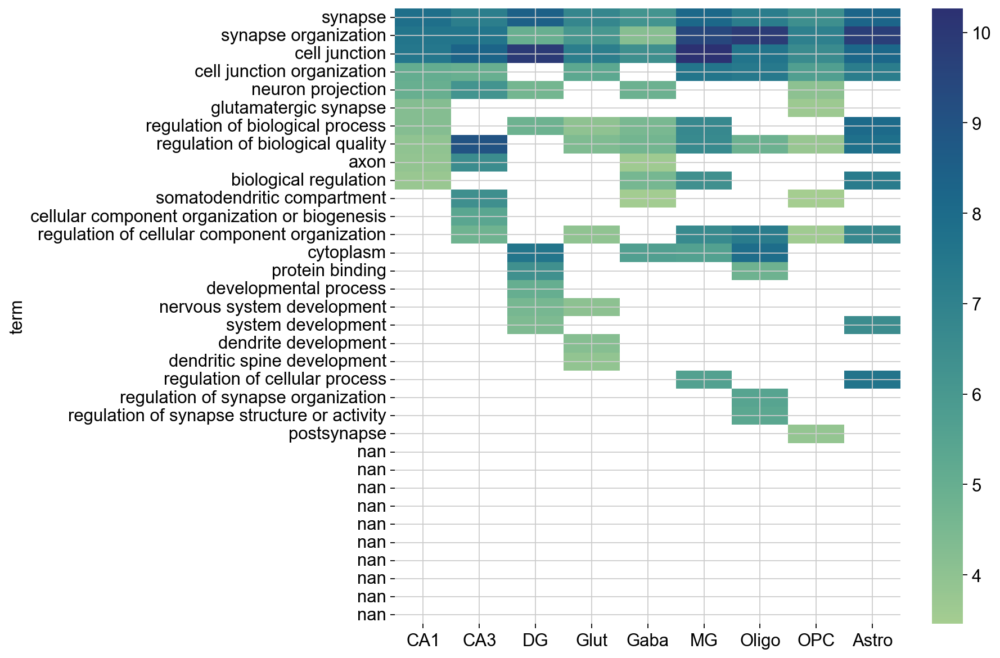

In [380]:
#plot GO terms
sns_plot = sns.heatmap(pivot_table, cmap='crest', xticklabels=True, yticklabels=True)
plt.savefig('outputGOX.pdf')

In [381]:
### gene marker graphs 

In [382]:
#markers 
marker_genes_dict_baam= {
"Astro": ["mus__Aldh1l1"], #Zeisel
"CA1": ["mus__Spink8", 
"mus__Fibcd1"], ## Zeisel
"CA3": ["mus__Il16"], ### Allen
"DG": ["mus__Prox1"], ## Allen
"Glut neuron": [
"mus__Slc17a7"], ## Allen
"GABA neuron": [
"mus__Gad1"], ## Allen
"Neuron": ["mus__Syt1" ##webb
    ],
"Endo": ["mus__Ly6c1", 
"mus__Flt1"], ## Zeisel
"OPC": ["mus__Pdgfra"],## Webb 
"Oligo": ["mus__Hapln2", 
"mus__Tnfaip6"], ## Zeisel 
"VLMC": [ "mus__Col1a1" ], ##Tasic 
"MG": ["mus__F13a1",
"mus__C1qc"], ## Zeisel




}

In [383]:
#scale for comparison
adata.layers["scaled"] = sc.pp.scale(adata, copy=True).X

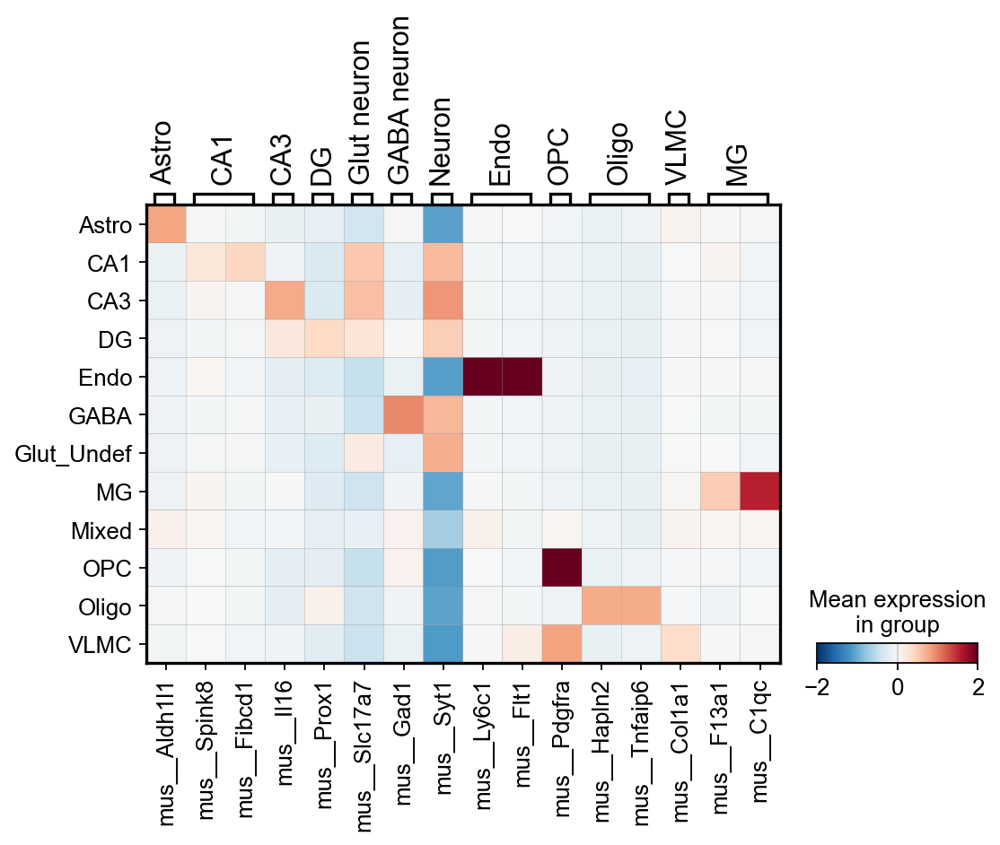

In [384]:
# matrix plot 
sc.pl.matrixplot(
    adata,
    marker_genes_dict_baam,
    groupby="cell_type",
    layer="scaled",
    vmin=-2,
    vmax=2,
    cmap="RdBu_r")

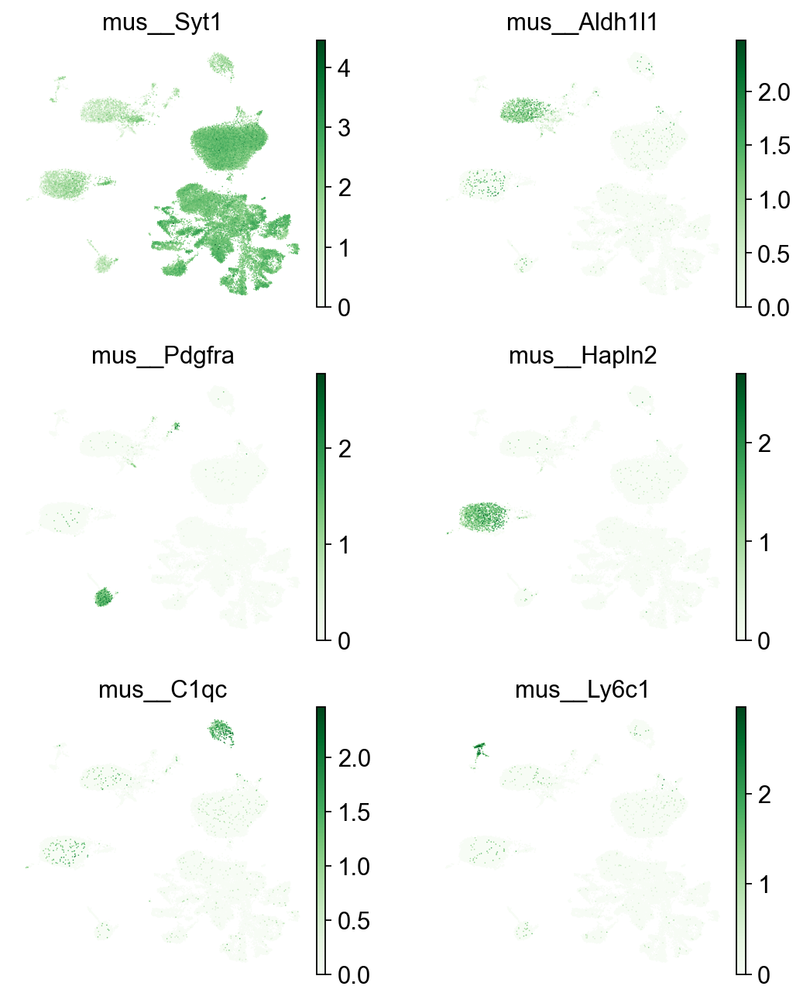

In [385]:
# plot cell type markers on UMAP
from matplotlib.pyplot import rc_context

color_vars = [
"mus__Syt1", #neurons
#"mus__Slc17a7", # Glut neuron
#"mus__Gad1", # GABA 
"mus__Aldh1l1", # Astro
"mus__Pdgfra", # OPC 
"mus__Hapln2", # oligo
"mus__C1qc", #MG
"mus__Ly6c1", #endo 
]
with rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(adata, color=color_vars, s=2, frameon=False, ncols=2, vmax="p100", color_map="Greens")

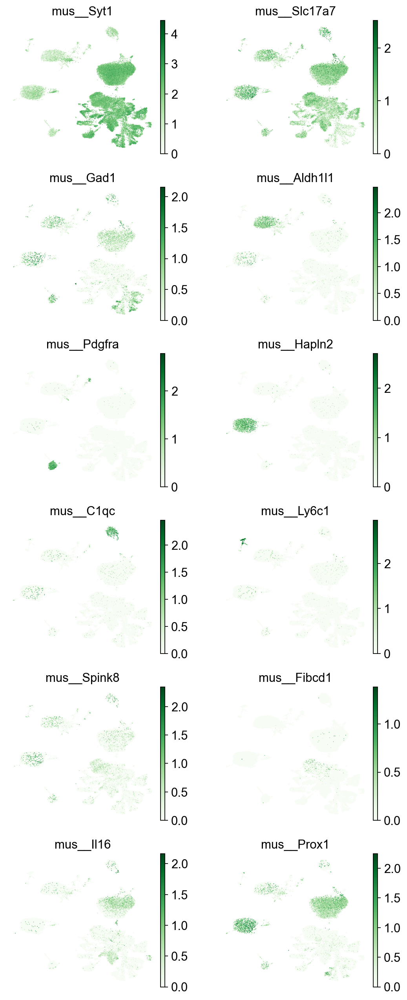

In [386]:
# plot cell type markers on UMAP

from matplotlib.pyplot import rc_context

color_vars = [
"mus__Syt1", #neurons
"mus__Slc17a7", # Glut neuron
"mus__Gad1", # GABA 
"mus__Aldh1l1", # Astro
"mus__Pdgfra", # OPC 
"mus__Hapln2", # oligo
"mus__C1qc", #MG
"mus__Ly6c1", #endo 
"mus__Spink8", #CA1
"mus__Fibcd1", #CA1
"mus__Il16",#CA3
"mus__Prox1", #DG
]

with rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(adata, color=color_vars, s=2, frameon=False, ncols=2, vmax="p100", color_map="Greens")

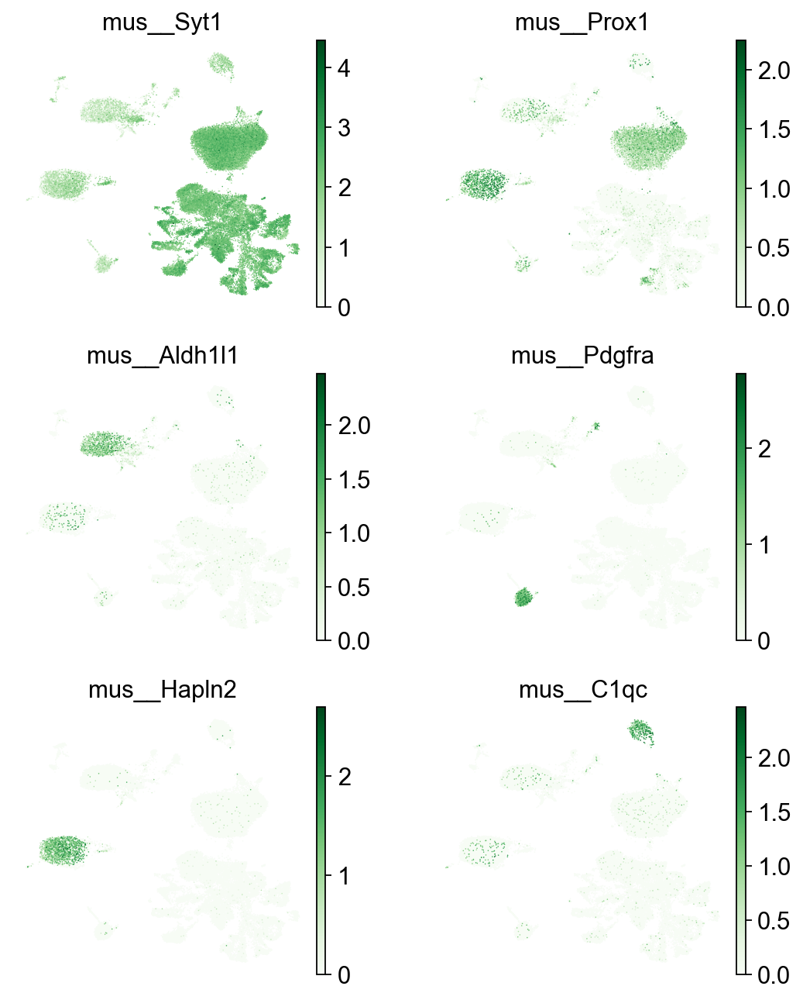

In [387]:
# plot cell type markers on UMAP
from matplotlib.pyplot import rc_context

color_vars = [
"mus__Syt1", #neurons
#"mus__Slc17a7", # Glut neuron
#"mus__Gad1", # GABA 

"mus__Prox1",
"mus__Aldh1l1", # Astro
"mus__Pdgfra", # OPC 
"mus__Hapln2", # oligo
"mus__C1qc", #MG
#"mus__Ly6c1", #endo 

]
with rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(adata, color=color_vars, s=2, frameon=False, ncols=2, vmax="p100", color_map="Greens")

In [388]:
## pseudobulking for DEGs
# pipeline adapted from https://decoupler-py.readthedocs.io/en/latest/notebooks/pseudobulk.html#

In [389]:
#  highly variable genes
sc.pp.highly_variable_genes(adata)


In [390]:
# Scale the data
sc.pp.scale(adata, max_value=10)

In [391]:
# PCA
sc.tl.pca(adata, svd_solver='arpack', use_highly_variable=True)


In [392]:
# neighbors
sc.pp.neighbors(adata)

In [393]:
# UMAP
sc.tl.umap(adata)


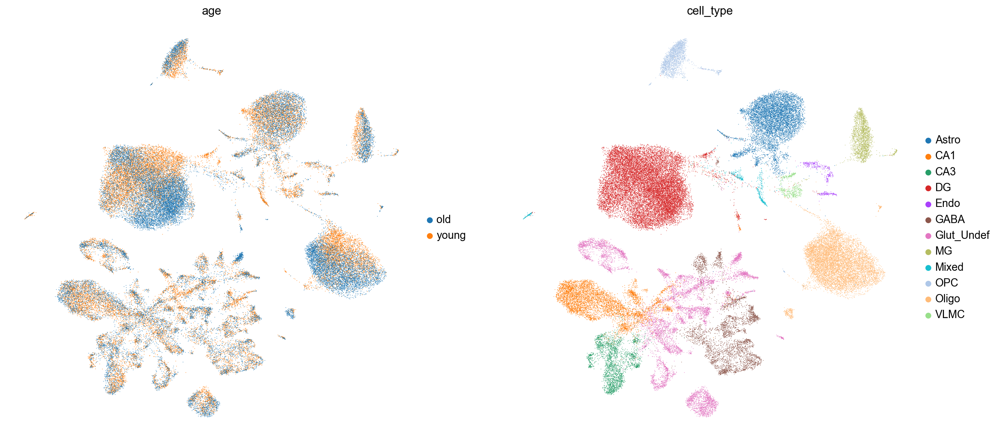

In [394]:
# graph
sc.pl.umap(adata, color=['age','cell_type'], frameon=False)


In [395]:
#  pseudo-bulk 
pdata = dc.get_pseudobulk(
    adata,
    sample_col='sample',
    groups_col='cell_type',
    layer='counts',
    mode='sum',
    min_cells=0,
    min_counts=0
)


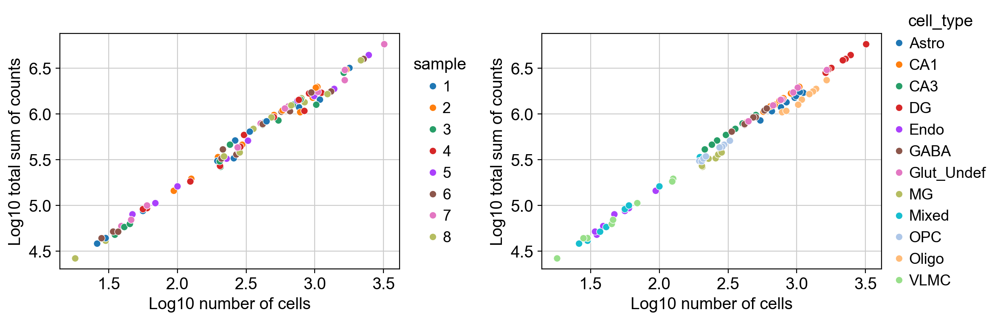

In [396]:
#samples and cell types by number of cells and counts 
dc.plot_psbulk_samples(pdata, groupby=['sample', 'cell_type'], figsize=(12, 4))


In [397]:
# raw counts to layer
pdata.layers['counts'] = pdata.X.copy()

# Normalize
sc.pp.normalize_total(pdata)
sc.pp.log1p(pdata)
#scale
sc.pp.scale(pdata, max_value=10)
#PCA
sc.tl.pca(pdata)

#  raw counts to X
dc.swap_layer(pdata, 'counts', X_layer_key=None, inplace=True)


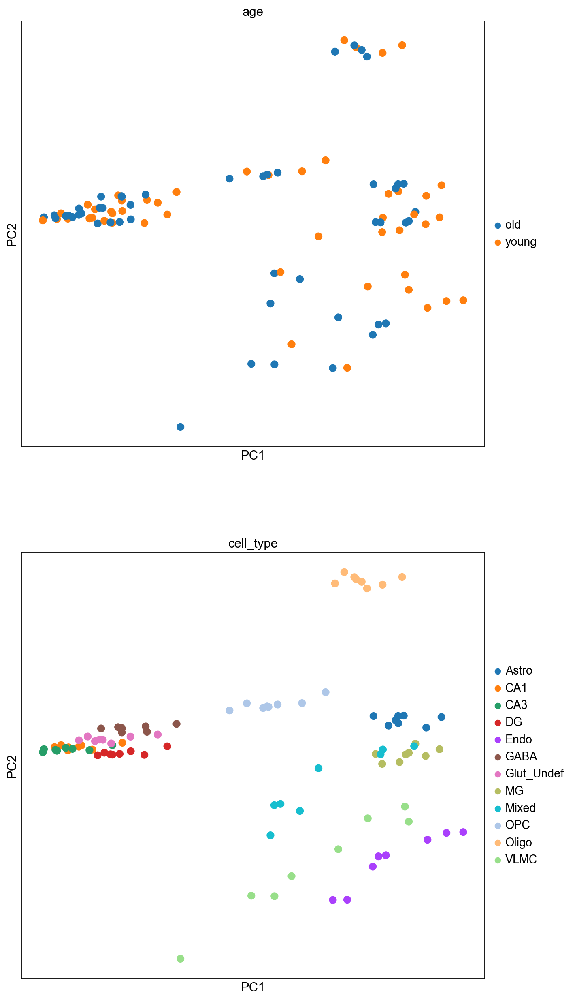

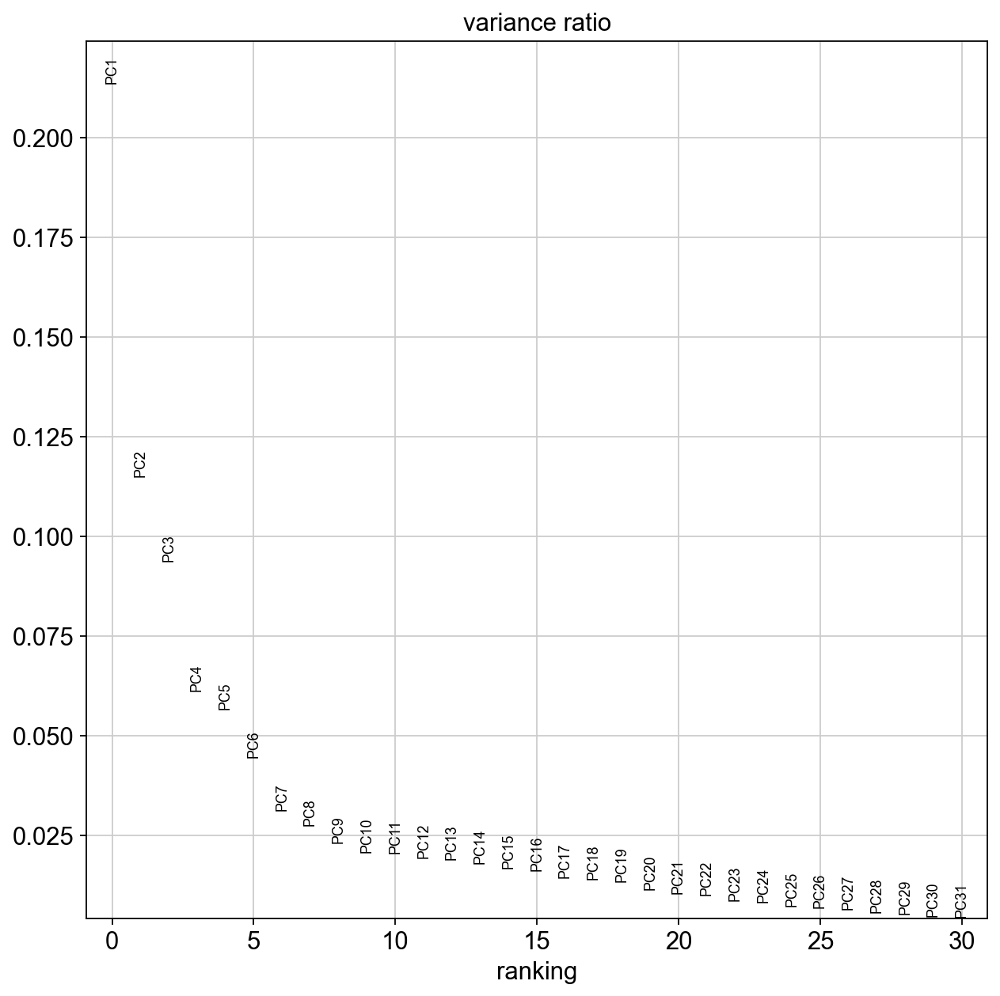

In [398]:
#plot PCA 
sc.pl.pca(pdata, color=['age', 'cell_type'], ncols=1, size=300)
sc.pl.pca_variance_ratio(pdata)


In [399]:
# metadata plots
dc.get_metadata_associations(
    pdata,
    obs_keys = ['age', 'cell_type', 'psbulk_n_cells', 'psbulk_counts'],  # Metadata columns to associate to PCs
    obsm_key='X_pca',  # Where the PCs are stored
    uns_key='pca_anova',  # Where the results are stored
    inplace=True,)


In [400]:
# select cells by type 
All = pdata 
Allnom = pdata[~pdata.obs['cell_type'].isin(['Mixed'])].copy()
Astro = pdata[pdata.obs['cell_type'].isin(['Astro'])].copy()
CA1 = pdata[pdata.obs['cell_type'].isin(['CA1'])].copy()
CA3 = pdata[pdata.obs['cell_type'].isin(['CA3'])].copy()
DG = pdata[pdata.obs['cell_type'].isin(['DG'])].copy()
Endo = pdata[pdata.obs['cell_type'].isin(['Endo'])].copy()
GABA = pdata[pdata.obs['cell_type'].isin(['GABA'])].copy()
Glut = pdata[pdata.obs['cell_type'].isin(['Glut_Undef'])].copy()
Micro = pdata[pdata.obs['cell_type'].isin(['MG'])].copy()
OPC = pdata[pdata.obs['cell_type'].isin(['OPC'])].copy()
Oligo = pdata[pdata.obs['cell_type'].isin(['Oligo'])].copy()
VLMC = pdata[pdata.obs['cell_type'].isin(['VLMC'])].copy()



In [401]:
#round 
All.X = np.round(All.X)
Allnom.X = np.round(Allnom.X)
Astro.X = np.round(Astro.X)
CA1.X = np.round(CA1.X)
CA3.X = np.round(CA3.X)
DG.X = np.round(DG.X)
Endo.X = np.round(Endo.X)
GABA.X = np.round(GABA.X)
Glut.X = np.round(Glut.X)
Micro.X = np.round(Micro.X)
OPC.X = np.round(OPC.X)
Oligo.X = np.round(Oligo.X)
VLMC.X = np.round(VLMC.X)


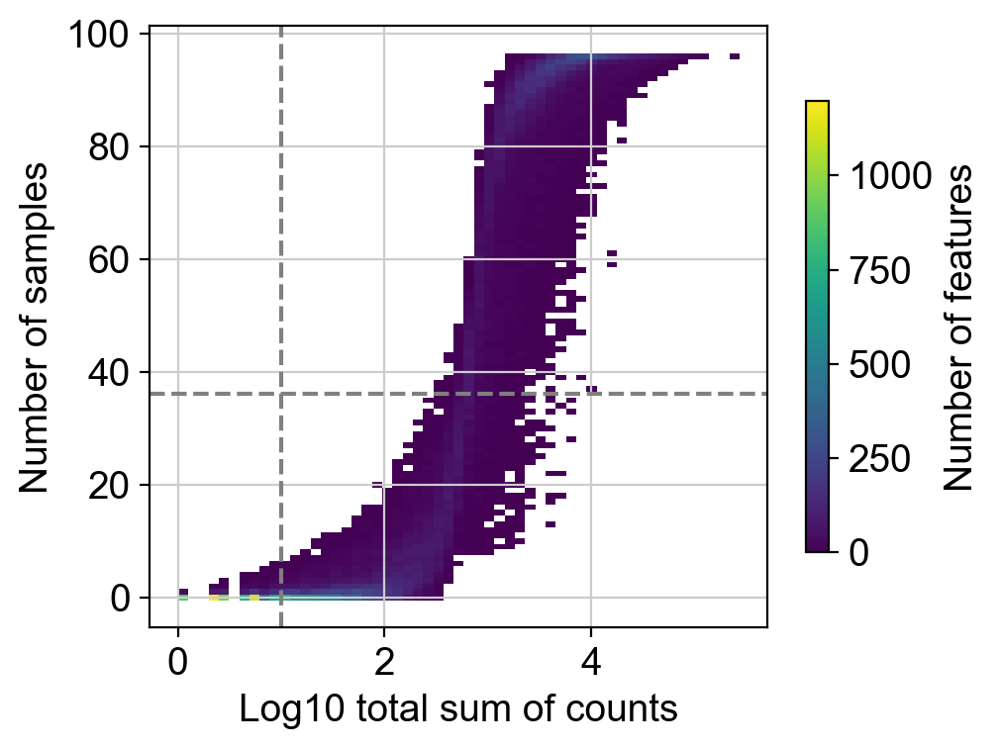

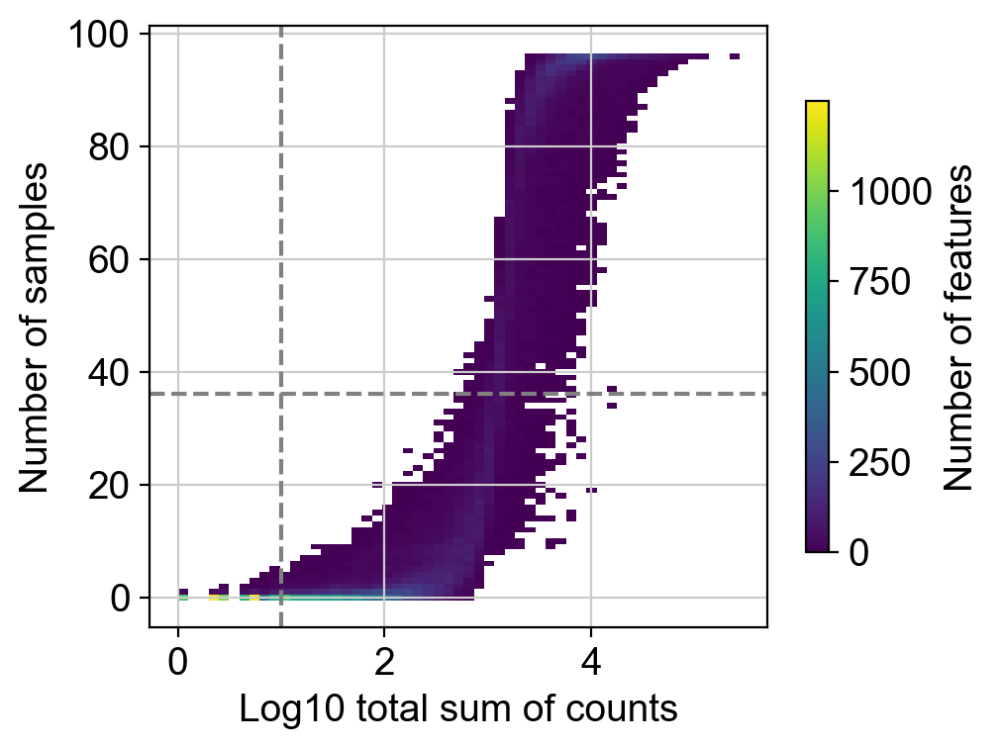

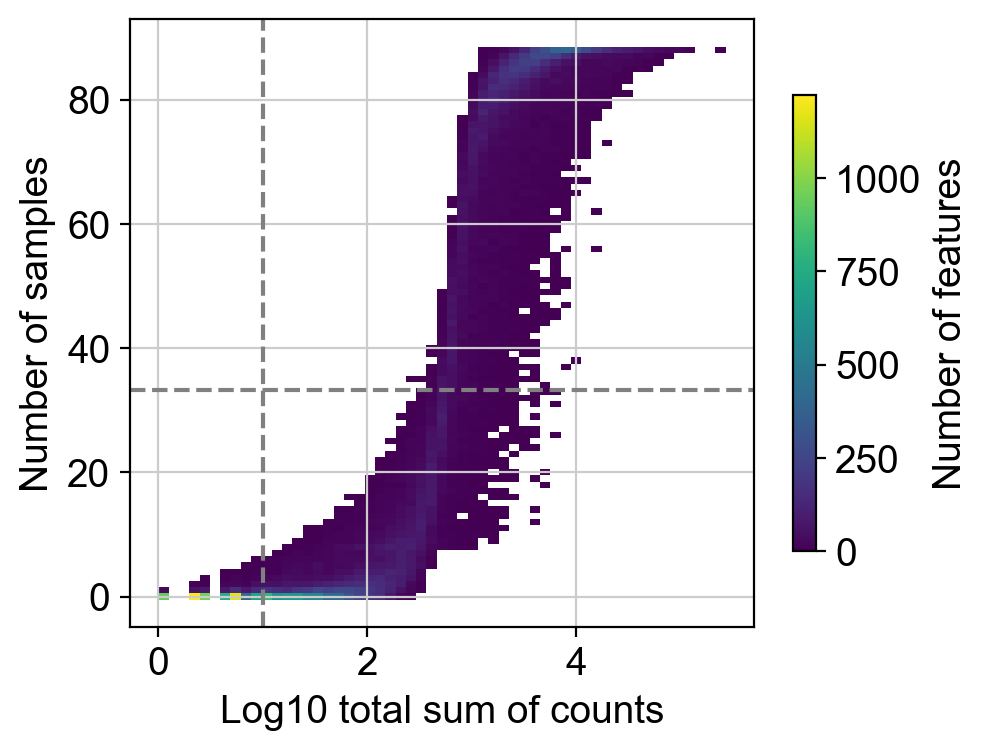

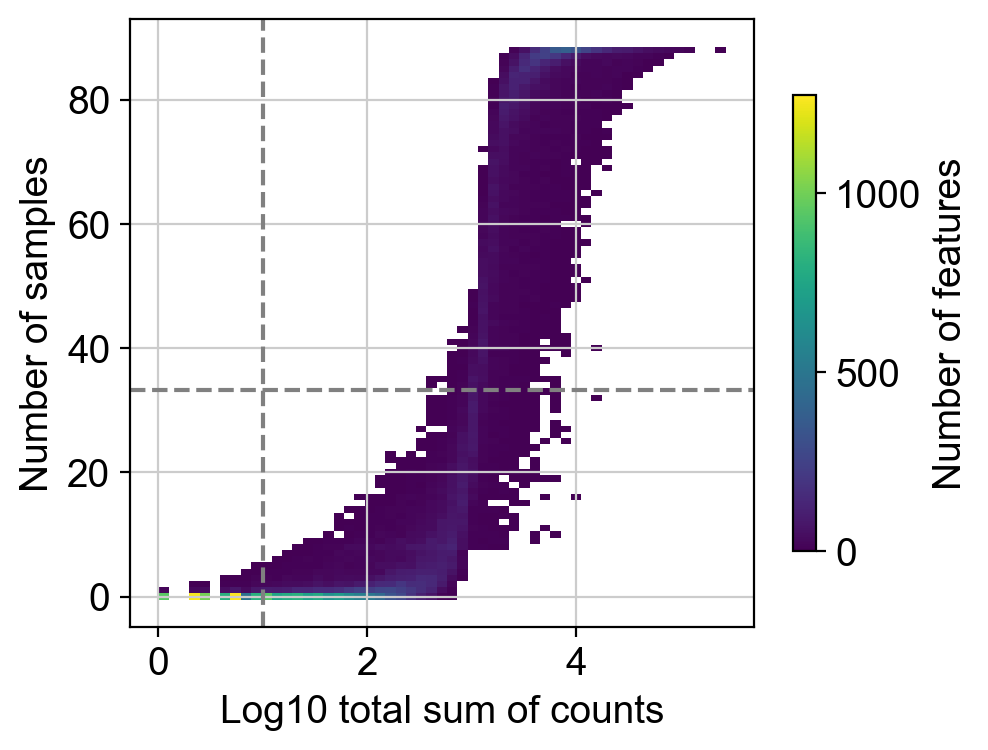

In [402]:
# try DEG cutoffs 

#dc.plot_filter_by_expr(All, group='age', min_count=1, min_total_count=1)
#dc.plot_filter_by_expr(All, group='age', min_count=2, min_total_count=2)
#dc.plot_filter_by_expr(All, group='age', min_count=5, min_total_count=5)
dc.plot_filter_by_expr(All, group='age', min_count=5, min_total_count=10)
dc.plot_filter_by_expr(All, group='age', min_count=10, min_total_count=10)
#dc.plot_filter_by_expr(All, group='age', min_count=20, min_total_count=40)


#dc.plot_filter_by_expr(Allnom, group='age', min_count=1, min_total_count=1)
#dc.plot_filter_by_expr(Allnom, group='age', min_count=2, min_total_count=2)
#dc.plot_filter_by_expr(Allnom, group='age', min_count=5, min_total_count=5)
dc.plot_filter_by_expr(Allnom, group='age', min_count=5, min_total_count=10)
dc.plot_filter_by_expr(Allnom, group='age', min_count=10, min_total_count=10)




#dc.plot_filter_by_expr(Astro, group='age', min_count=1, min_total_count=1)
#dc.plot_filter_by_expr(Astro, group='age', min_count=2, min_total_count=2)
##dc.plot_filter_by_expr(Astro, group='age', min_count=5, min_total_count=5)
##dc.plot_filter_by_expr(Astro, group='age', min_count=5, min_total_count=10)
##dc.plot_filter_by_expr(Astro, group='age', min_count=10, min_total_count=10)

#dc.plot_filter_by_expr(CA1, group='age', min_count=1, min_total_count=1)
#dc.plot_filter_by_expr(CA1, group='age', min_count=2, min_total_count=2)
##dc.plot_filter_by_expr(CA1, group='age', min_count=5, min_total_count=5)
##dc.plot_filter_by_expr(CA1, group='age', min_count=5, min_total_count=10)
##dc.plot_filter_by_expr(CA1, group='age', min_count=10, min_total_count=10)

#dc.plot_filter_by_expr(CA3, group='age', min_count=1, min_total_count=1)
#dc.plot_filter_by_expr(CA3, group='age', min_count=2, min_total_count=2)
##dc.plot_filter_by_expr(CA3, group='age', min_count=5, min_total_count=5)
##dc.plot_filter_by_expr(CA3, group='age', min_count=5, min_total_count=10)
##dc.plot_filter_by_expr(CA3, group='age', min_count=10, min_total_count=10)

#dc.plot_filter_by_expr(DG, group='age', min_count=1, min_total_count=1)
#dc.plot_filter_by_expr(DG, group='age', min_count=2, min_total_count=2)
##dc.plot_filter_by_expr(DG, group='age', min_count=5, min_total_count=5)
##dc.plot_filter_by_expr(DG, group='age', min_count=5, min_total_count=10)
##dc.plot_filter_by_expr(DG, group='age', min_count=10, min_total_count=10)

##dc.plot_filter_by_expr(Endo, group='age', min_count=1, min_total_count=1)
##dc.plot_filter_by_expr(Endo, group='age', min_count=2, min_total_count=2)
#dc.plot_filter_by_expr(Endo, group='age', min_count=5, min_total_count=5)
#dc.plot_filter_by_expr(Endo, group='age', min_count=5, min_total_count=10)
#dc.plot_filter_by_expr(Endo, group='age', min_count=10, min_total_count=10)

#dc.plot_filter_by_expr(GABA, group='age', min_count=1, min_total_count=1)
#dc.plot_filter_by_expr(GABA, group='age', min_count=2, min_total_count=2)
##dc.plot_filter_by_expr(GABA, group='age', min_count=5, min_total_count=5)
##dc.plot_filter_by_expr(GABA, group='age', min_count=5, min_total_count=10)
##dc.plot_filter_by_expr(GABA, group='age', min_count=10, min_total_count=10)

#dc.plot_filter_by_expr(Glut, group='age', min_count=1, min_total_count=1)
#dc.plot_filter_by_expr(Glut, group='age', min_count=2, min_total_count=2)
##dc.plot_filter_by_expr(Glut, group='age', min_count=5, min_total_count=5)
##dc.plot_filter_by_expr(Glut, group='age', min_count=5, min_total_count=10)
##dc.plot_filter_by_expr(Glut, group='age', min_count=10, min_total_count=10)

#dc.plot_filter_by_expr(Micro, group='age', min_count=1, min_total_count=1)
#dc.plot_filter_by_expr(Micro, group='age', min_count=2, min_total_count=2)
##dc.plot_filter_by_expr(Micro, group='age', min_count=5, min_total_count=5)
##dc.plot_filter_by_expr(Micro, group='age', min_count=5, min_total_count=10)
##dc.plot_filter_by_expr(Micro, group='age', min_count=10, min_total_count=10)

#dc.plot_filter_by_expr(OPC, group='age', min_count=1, min_total_count=1)
#dc.plot_filter_by_expr(OPC, group='age', min_count=2, min_total_count=2)
##dc.plot_filter_by_expr(OPC, group='age', min_count=5, min_total_count=5)
##dc.plot_filter_by_expr(OPC, group='age', min_count=5, min_total_count=10)
#dc.plot_filter_by_expr(OPC, group='age', min_count=10, min_total_count=10)

#dc.plot_filter_by_expr(Oligo, group='age', min_count=1, min_total_count=1)
#dc.plot_filter_by_expr(Oligo, group='age', min_count=2, min_total_count=2)
##dc.plot_filter_by_expr(Oligo, group='age', min_count=5, min_total_count=5)
##dc.plot_filter_by_expr(Oligo, group='age', min_count=5, min_total_count=10)
##dc.plot_filter_by_expr(Oligo, group='age', min_count=10, min_total_count=10)

#dc.plot_filter_by_expr(VLMC, group='age', min_count=1, min_total_count=1)
#dc.plot_filter_by_expr(VLMC, group='age', min_count=2, min_total_count=2)
#dc.plot_filter_by_expr(VLMC, group='age', min_count=5, min_total_count=5)
#dc.plot_filter_by_expr(VLMC, group='age', min_count=5, min_total_count=10)
#dc.plot_filter_by_expr(VLMC, group='age', min_count=10, min_total_count=10)


In [403]:
# Genes meeting threshold
genes = dc.filter_by_expr(All, group='age', min_count=10, min_total_count=10)
# Filter
All = All[:, genes].copy()

# Genes meeting threshold
genes = dc.filter_by_expr(Allnom, group='age', min_count=10, min_total_count=10)
# Filter
Allnom = Allnom[:, genes].copy()

# Genes meeting threshold
genes = dc.filter_by_expr(Astro, group='age', min_count=10, min_total_count=10)
# Filter
Astro = Astro[:, genes].copy()


# Genes meeting threshold
genes = dc.filter_by_expr(CA1, group='age', min_count=10, min_total_count=10)
# Filter
CA1 = CA1[:, genes].copy()


# Genes meeting threshold
genes = dc.filter_by_expr(CA3, group='age', min_count=10, min_total_count=10)
# Filter
CA3 = CA3[:, genes].copy()


# Genes meeting threshold
genes = dc.filter_by_expr(DG, group='age', min_count=10, min_total_count=10)
# Filter
DG = DG[:, genes].copy()


# Genes meeting threshold
genes = dc.filter_by_expr(Endo, group='age', min_count=10, min_total_count=10)
# Filter
Endo = Endo[:, genes].copy()


# Genes meeting threshold
genes = dc.filter_by_expr(GABA, group='age', min_count=10, min_total_count=10)
# Filter
GABA = GABA[:, genes].copy()

# Genes meeting threshold
genes = dc.filter_by_expr(Glut, group='age', min_count=10, min_total_count=10)
# Filter
Glut = Glut[:, genes].copy()


# Genes meeting threshold
genes = dc.filter_by_expr(Micro, group='age', min_count=10, min_total_count=10)
# Filter
Micro = Micro[:, genes].copy()

# Genes meeting threshold
genes = dc.filter_by_expr(OPC, group='age', min_count=10, min_total_count=10)
# Filter
OPC = OPC[:, genes].copy()


# Genes meeting threshold
genes = dc.filter_by_expr(Oligo, group='age', min_count=10, min_total_count=10)
# Filter
Oligo = Oligo[:, genes].copy()


# Genes meeting threshold
genes = dc.filter_by_expr(VLMC, group='age', min_count=10, min_total_count=10)
# Filter
VLMC = VLMC[:, genes].copy()





In [404]:
# Import DESeq2
import  pydeseq2
from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats


In [405]:
# DESeq2 object
inference = DefaultInference(n_cpus=8)
dds_VLMC = DeseqDataSet(
    adata=VLMC,
    design_factors='age',
    refit_cooks=True,
    inference=inference,
)
# LFC
dds_VLMC.deseq2()
# old vs young
stat_res_VLMC = DeseqStats(
    dds_VLMC,
    contrast=['age', 'old', 'young'],
    inference=inference,
)
# Wald test
stat_res_VLMC.summary()
# results filtered by significance 
results_df_VLMC = stat_res_VLMC.results_df
results_df_VLMC['sig'] = results_df_VLMC.apply(
    lambda row: 's' if (row['log2FoldChange'] > 0.1 or row['log2FoldChange'] < -0.1) and row['padj'] < 0.05 else 'n', 
    axis=1
)

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 4.66 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

Fitting MAP dispersions...
... done in 3.79 seconds.

Fitting LFCs...
... done in 0.73 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.45 seconds.



Log2 fold change & Wald test p-value: age old vs young
                     baseMean  log2FoldChange     lfcSE      stat    pvalue  \
cast_1700112E06Rik  12.707129       -0.236961  0.350218 -0.676612  0.498652   
cast_2010111I01Rik  11.730191       -0.537068  0.393115 -1.366187  0.171880   
cast_2410089E03Rik  10.834505       -0.332558  0.326161 -1.019614  0.307912   
cast_AI314180       14.373406       -0.831510  0.347362 -2.393786  0.016675   
cast_Aak1           11.712220       -0.152940  0.312603 -0.489246  0.624667   
...                       ...             ...       ...       ...       ...   
mus__mt-Co3         51.171432       -0.177958  0.266586 -0.667546  0.504424   
mus__mt-Cytb        18.625433        0.099404  0.373915  0.265847  0.790357   
mus__mt-Nd1         17.448790        0.405535  0.470999  0.861010  0.389233   
mus__mt-Nd2         21.164717        0.194398  0.281387  0.690857  0.489656   
mus__mt-Nd4         22.728765        0.287360  0.341504  0.841454  0.400093 

In [406]:
# DESeq2 object
inference = DefaultInference(n_cpus=8)
dds_Astro = DeseqDataSet(
    adata=Astro,
    design_factors='age',
    refit_cooks=True,
    inference=inference,
)
# LFC
dds_Astro.deseq2()
# old vs young
stat_res_Astro = DeseqStats(
    dds_Astro,
    contrast=['age', 'old', 'young'],
    inference=inference,
)
# Wald test
stat_res_Astro.summary()
# results filtered by significance 
results_df_Astro = stat_res_Astro.results_df
results_df_Astro['sig'] = results_df_Astro.apply(
    lambda row: 's' if (row['log2FoldChange'] > 0.1 or row['log2FoldChange'] < -0.1) and row['padj'] < 0.05 else 'n', 
    axis=1
)

Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 64.83 seconds.

Fitting dispersion trend curve...
... done in 0.78 seconds.

Fitting MAP dispersions...
... done in 58.41 seconds.

Fitting LFCs...
... done in 5.44 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 1.75 seconds.



Log2 fold change & Wald test p-value: age old vs young
                      baseMean  log2FoldChange     lfcSE      stat    pvalue  \
cast_0610007P14Rik   31.007517        0.455268  0.221423  2.056106  0.039772   
cast_0610009L18Rik   19.893946        0.129484  0.277246  0.467035  0.640475   
cast_0610009O20Rik   33.982929        0.208778  0.227076  0.919418  0.357877   
cast_0610010F05Rik   28.857216       -0.228524  0.185776 -1.230104  0.218658   
cast_0610030E20Rik   19.069614       -0.010658  0.228940 -0.046553  0.962869   
...                        ...             ...       ...       ...       ...   
mus__mt-Nd3          66.706734        0.469651  0.264300  1.776958  0.075575   
mus__mt-Nd4         462.419281        0.207194  0.178873  1.158330  0.246729   
mus__mt-Nd4l         48.848003        0.395166  0.315477  1.252601  0.210351   
mus__mt-Nd5         114.662361        0.431988  0.240098  1.799214  0.071985   
mus__mt-Nd6          25.364185       -0.126464  0.333959 -0.37868

In [407]:
# DESeq2 object
inference = DefaultInference(n_cpus=8)
dds_CA1 = DeseqDataSet(
    adata=CA1,
    design_factors='age',
    refit_cooks=True,
    inference=inference,
)
# LFC
dds_CA1.deseq2()
# old vs young
stat_res_CA1 = DeseqStats(
    dds_CA1,
    contrast=['age', 'old', 'young'],
    inference=inference,
)
# Wald test
stat_res_CA1.summary()
# results filtered by significance 
results_df_CA1 = stat_res_CA1.results_df
results_df_CA1['sig'] = results_df_CA1.apply(
    lambda row: 's' if (row['log2FoldChange'] > 0.1 or row['log2FoldChange'] < -0.1) and row['padj'] < 0.05 else 'n', 
    axis=1
)

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 73.45 seconds.

Fitting dispersion trend curve...
... done in 0.84 seconds.

Fitting MAP dispersions...
... done in 57.91 seconds.

Fitting LFCs...
... done in 3.41 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 2.52 seconds.



Log2 fold change & Wald test p-value: age old vs young
                     baseMean  log2FoldChange     lfcSE      stat    pvalue  \
cast_0610007P14Rik  36.116238        0.205277  0.168812  1.216010  0.223981   
cast_0610009L18Rik  10.726315        0.197062  0.307427  0.641006  0.521519   
cast_0610009O20Rik  26.113916        0.086488  0.198247  0.436265  0.662644   
cast_0610010F05Rik  70.866287        0.140330  0.119764  1.171724  0.241308   
cast_0610030E20Rik  13.108856       -0.183928  0.283939 -0.647771  0.517133   
...                       ...             ...       ...       ...       ...   
mus__mt-Cytb        55.890945        0.063567  0.295045  0.215448  0.829418   
mus__mt-Nd1         53.209190        0.538728  0.240855  2.236728  0.025304   
mus__mt-Nd2         67.555305        0.044728  0.298846  0.149669  0.881026   
mus__mt-Nd4         74.314545        0.397719  0.237226  1.676537  0.093633   
mus__mt-Nd5         14.826012        0.670035  0.374485  1.789217  0.073580 

In [408]:
# DESeq2 object
inference = DefaultInference(n_cpus=8)
dds_CA3 = DeseqDataSet(
    adata=CA3,
    design_factors='age',
    refit_cooks=True,
    inference=inference,
)
# LFC
dds_CA3.deseq2()
# old vs young
stat_res_CA3 = DeseqStats(
    dds_CA3,
    contrast=['age', 'old', 'young'],
    inference=inference,
)
# Wald test
stat_res_CA3.summary()
# results filtered by significance 
results_df_CA3 = stat_res_CA3.results_df
results_df_CA3['sig'] = results_df_CA3.apply(
    lambda row: 's' if (row['log2FoldChange'] > 0.1 or row['log2FoldChange'] < -0.1) and row['padj'] < 0.05 else 'n', 
    axis=1
)

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 50.17 seconds.

Fitting dispersion trend curve...
... done in 0.56 seconds.

Fitting MAP dispersions...
... done in 45.83 seconds.

Fitting LFCs...
... done in 2.64 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 1.17 seconds.



Log2 fold change & Wald test p-value: age old vs young
                     baseMean  log2FoldChange     lfcSE      stat    pvalue  \
cast_0610007P14Rik  17.377586        0.267057  0.242233  1.102480  0.270253   
cast_0610009O20Rik  13.121065        0.320686  0.279246  1.148399  0.250804   
cast_0610010F05Rik  36.725674        0.176296  0.165218  1.067053  0.285948   
cast_1110004F10Rik  10.566443       -0.077278  0.308863 -0.250202  0.802431   
cast_1110008L16Rik   9.597066       -0.136172  0.322596 -0.422111  0.672944   
...                       ...             ...       ...       ...       ...   
mus__mt-Co3         86.921173        0.141804  0.288717  0.491152  0.623319   
mus__mt-Cytb        21.238678        0.010412  0.266147  0.039120  0.968794   
mus__mt-Nd1         21.562883        0.304340  0.338377  0.899412  0.368433   
mus__mt-Nd2         26.591166       -0.222274  0.335657 -0.662204  0.507840   
mus__mt-Nd4         29.560492        0.157322  0.319935  0.491730  0.622910 

In [409]:
# DESeq2 object
inference = DefaultInference(n_cpus=8)
dds_DG = DeseqDataSet(
    adata=DG,
    design_factors='age',
    refit_cooks=True,
    inference=inference,
)
# LFC
dds_DG.deseq2()
# old vs young
stat_res_DG = DeseqStats(
    dds_DG,
    contrast=['age', 'old', 'young'],
    inference=inference,
)
# Wald test
stat_res_DG.summary()
# results filtered by significance 
results_df_DG = stat_res_DG.results_df
results_df_DG['sig'] = results_df_DG.apply(
    lambda row: 's' if (row['log2FoldChange'] > 0.1 or row['log2FoldChange'] < -0.1) and row['padj'] < 0.05 else 'n', 
    axis=1
)

Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 85.97 seconds.

Fitting dispersion trend curve...
... done in 1.11 seconds.

Fitting MAP dispersions...
... done in 87.32 seconds.

Fitting LFCs...
... done in 8.74 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 3.58 seconds.



Log2 fold change & Wald test p-value: age old vs young
                      baseMean  log2FoldChange     lfcSE      stat    pvalue  \
cast_0610007P14Rik   97.576775        0.037291  0.102277  0.364612  0.715401   
cast_0610009L18Rik   33.517437       -0.067192  0.176362 -0.380991  0.703210   
cast_0610009O20Rik   82.090858       -0.017998  0.136240 -0.132109  0.894898   
cast_0610010F05Rik  155.491058        0.123964  0.081144  1.527718  0.126583   
cast_0610012G03Rik   15.406626       -0.500126  0.296025 -1.689473  0.091129   
...                        ...             ...       ...       ...       ...   
mus__mt-Nd3          47.546516        0.454415  0.266430  1.705568  0.088089   
mus__mt-Nd4         346.721069        0.380629  0.258816  1.470654  0.141385   
mus__mt-Nd4l         34.072426        0.594625  0.335159  1.774154  0.076038   
mus__mt-Nd5          77.478287        0.699768  0.263859  2.652052  0.008000   
mus__mt-Nd6          13.855440       -0.140990  0.320749 -0.43956

In [410]:
# DESeq2 object
inference = DefaultInference(n_cpus=8)
dds_Endo = DeseqDataSet(
    adata=Endo,
    design_factors='age',
    refit_cooks=True,
    inference=inference,
)
# LFC
dds_Endo.deseq2()
# old vs young
stat_res_Endo = DeseqStats(
    dds_Endo,
    contrast=['age', 'old', 'young'],
    inference=inference,
)
# Wald test
stat_res_Endo.summary()
# results filtered by significance 
results_df_Endo = stat_res_Endo.results_df
results_df_Endo['sig'] = results_df_Endo.apply(
    lambda row: 's' if (row['log2FoldChange'] > 0.1 or row['log2FoldChange'] < -0.1) and row['padj'] < 0.05 else 'n', 
    axis=1
)

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 5.59 seconds.

Fitting dispersion trend curve...
/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/pydeseq2/dds.py:590: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend()
... done in 0.09 seconds.

Fitting MAP dispersions...
... done in 4.56 seconds.

Fitting LFCs...
... done in 0.44 seconds.

Replacing 0 outlier genes.

Running Wald tests...


Log2 fold change & Wald test p-value: age old vs young
                     baseMean  log2FoldChange     lfcSE      stat    pvalue  \
cast_2010111I01Rik  12.848629        0.016018  0.275419  0.058158  0.953622   
cast_4931406P16Rik  16.413124        0.217349  0.242350  0.896838  0.369805   
cast_9430020K01Rik  12.390925       -0.512004  0.283670 -1.804926  0.071086   
cast_AW554918        8.174161       -0.084987  0.486210 -0.174795  0.861241   
cast_Abcb1a         20.376427        0.069304  0.220284  0.314610  0.753058   
...                       ...             ...       ...       ...       ...   
mus__mt-Co3         56.682491        0.081307  0.154669  0.525681  0.599110   
mus__mt-Cytb        24.765373        0.160966  0.198860  0.809445  0.418259   
mus__mt-Nd1         21.591825        0.160250  0.245234  0.653458  0.513461   
mus__mt-Nd2         26.305603       -0.041570  0.194266 -0.213983  0.830560   
mus__mt-Nd4         31.021620        0.028314  0.245401  0.115377  0.908146 

... done in 0.26 seconds.



In [411]:
# DESeq2 object
inference = DefaultInference(n_cpus=8)
dds_GABA = DeseqDataSet(
    adata=GABA,
    design_factors='age',
    refit_cooks=True,
    inference=inference,
)
# LFC
dds_GABA.deseq2()
# old vs young
stat_res_GABA = DeseqStats(
    dds_GABA,
    contrast=['age', 'old', 'young'],
    inference=inference,
)
# Wald test
stat_res_GABA.summary()
# results filtered by significance 
results_df_GABA = stat_res_GABA.results_df
results_df_GABA['sig'] = results_df_GABA.apply(
    lambda row: 's' if (row['log2FoldChange'] > 0.1 or row['log2FoldChange'] < -0.1) and row['padj'] < 0.05 else 'n', 
    axis=1
)

Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 69.64 seconds.

Fitting dispersion trend curve...
... done in 1.52 seconds.

Fitting MAP dispersions...
... done in 49.21 seconds.

Fitting LFCs...
... done in 3.21 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 1.36 seconds.



Log2 fold change & Wald test p-value: age old vs young
                     baseMean  log2FoldChange     lfcSE      stat    pvalue  \
cast_0610007P14Rik  25.372364        0.242792  0.212974  1.140006  0.254284   
cast_0610009O20Rik  21.680836       -0.155252  0.237761 -0.652974  0.513773   
cast_0610010F05Rik  62.068886        0.112726  0.128898  0.874533  0.381828   
cast_0610043K17Rik   9.659048       -0.551680  0.334362 -1.649950  0.098953   
cast_1110002L01Rik  12.819870        0.569080  0.284253  2.002020  0.045283   
...                       ...             ...       ...       ...       ...   
mus__mt-Nd1         47.342396        0.247246  0.311054  0.794864  0.426692   
mus__mt-Nd2         53.822296       -0.113304  0.284830 -0.397794  0.690782   
mus__mt-Nd3         10.761262        0.615275  0.324359  1.896899  0.057841   
mus__mt-Nd4         65.222374        0.217789  0.286201  0.760966  0.446677   
mus__mt-Nd5         13.856276        0.691385  0.401501  1.722001  0.085069 

In [412]:
# DESeq2 object
inference = DefaultInference(n_cpus=8)
dds_Glut = DeseqDataSet(
    adata=Glut,
    design_factors='age',
    refit_cooks=True,
    inference=inference,
)
# LFC
dds_Glut.deseq2()
# old vs young
stat_res_Glut = DeseqStats(
    dds_Glut,
    contrast=['age', 'old', 'young'],
    inference=inference,
)
# Wald test
stat_res_Glut.summary()
# results filtered by significance 
results_df_Glut = stat_res_Glut.results_df
results_df_Glut['sig'] = results_df_Glut.apply(
    lambda row: 's' if (row['log2FoldChange'] > 0.1 or row['log2FoldChange'] < -0.1) and row['padj'] < 0.05 else 'n', 
    axis=1
)

Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 67.88 seconds.

Fitting dispersion trend curve...
... done in 0.82 seconds.

Fitting MAP dispersions...
... done in 48.14 seconds.

Fitting LFCs...
... done in 3.87 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 1.50 seconds.



Log2 fold change & Wald test p-value: age old vs young
                      baseMean  log2FoldChange     lfcSE      stat    pvalue  \
cast_0610007P14Rik   51.683014       -0.054074  0.136984 -0.394746  0.693030   
cast_0610009L18Rik   11.203114        0.056030  0.344727  0.162534  0.870886   
cast_0610009O20Rik   36.759674       -0.131808  0.173353 -0.760344  0.447049   
cast_0610010F05Rik  101.791412        0.010334  0.096782  0.106775  0.914968   
cast_0610030E20Rik   14.177375        0.013235  0.294060  0.045009  0.964100   
...                        ...             ...       ...       ...       ...   
mus__mt-Nd1          81.183693        0.520551  0.296295  1.756867  0.078940   
mus__mt-Nd2         107.152061        0.141867  0.377830  0.375479  0.707304   
mus__mt-Nd3          17.502131        0.742798  0.366014  2.029427  0.042415   
mus__mt-Nd4         119.896393        0.355389  0.305857  1.161943  0.245259   
mus__mt-Nd5          22.569403        0.626897  0.394243  1.59013

In [413]:
# DESeq2 object
inference = DefaultInference(n_cpus=8)
dds_Micro = DeseqDataSet(
    adata=Micro,
    design_factors='age',
    refit_cooks=True,
    inference=inference,
)
# LFC
dds_Micro.deseq2()
# old vs young
stat_res_Micro = DeseqStats(
    dds_Micro,
    contrast=['age', 'old', 'young'],
    inference=inference,
)
# Wald test
stat_res_Micro.summary()
# results filtered by significance 
results_df_Micro = stat_res_Micro.results_df
results_df_Micro['sig'] = results_df_Micro.apply(
    lambda row: 's' if (row['log2FoldChange'] > 0.1 or row['log2FoldChange'] < -0.1) and row['padj'] < 0.05 else 'n', 
    axis=1
)

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 23.60 seconds.

Fitting dispersion trend curve...
... done in 0.36 seconds.

Fitting MAP dispersions...
... done in 16.58 seconds.

Fitting LFCs...
... done in 1.62 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.75 seconds.



Log2 fold change & Wald test p-value: age old vs young
                     baseMean  log2FoldChange     lfcSE      stat    pvalue  \
cast_0610040J01Rik  52.577148       -0.153829  0.164269 -0.936448  0.349043   
cast_1110034G24Rik  12.287840       -0.230673  0.371934 -0.620200  0.535126   
cast_1110037F02Rik  23.246180        0.369863  0.306500  1.206728  0.227537   
cast_1110051M20Rik  11.797396        0.238778  0.393953  0.606108  0.544443   
cast_1110059E24Rik   9.627800       -0.178846  0.432517 -0.413501  0.679240   
...                       ...             ...       ...       ...       ...   
mus__mt-Nd1         56.057468        0.851101  0.287905  2.956191  0.003115   
mus__mt-Nd2         75.830406        0.162272  0.241991  0.670570  0.502495   
mus__mt-Nd3         13.504191       -0.028200  0.485470 -0.058088  0.953678   
mus__mt-Nd4         90.041962        0.461991  0.244354  1.890664  0.058669   
mus__mt-Nd5         17.604712        1.213596  0.415000  2.924326  0.003452 

In [414]:
# DESeq2 object
inference = DefaultInference(n_cpus=8)
dds_OPC = DeseqDataSet(
    adata=OPC,
    design_factors='age',
    refit_cooks=True,
    inference=inference,
)
# LFC
dds_OPC.deseq2()
# old vs young
stat_res_OPC = DeseqStats(
    dds_OPC,
    contrast=['age', 'old', 'young'],
    inference=inference,
)
# Wald test
stat_res_OPC.summary()
# results filtered by significance 
results_df_OPC = stat_res_OPC.results_df
results_df_OPC['sig'] = results_df_OPC.apply(
    lambda row: 's' if (row['log2FoldChange'] > 0.1 or row['log2FoldChange'] < -0.1) and row['padj'] < 0.05 else 'n', 
    axis=1
)

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 26.95 seconds.

Fitting dispersion trend curve...
... done in 0.38 seconds.

Fitting MAP dispersions...
... done in 22.77 seconds.

Fitting LFCs...
... done in 1.71 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.95 seconds.



Log2 fold change & Wald test p-value: age old vs young
                     baseMean  log2FoldChange     lfcSE      stat    pvalue  \
cast_0610010F05Rik  10.879116        0.275521  0.304147  0.905881  0.364999   
cast_0610040J01Rik  19.086596        0.218937  0.233315  0.938378  0.348050   
cast_1110034G24Rik  11.775652        0.198427  0.346673  0.572375  0.567068   
cast_1110037F02Rik  25.318069       -0.027871  0.200213 -0.139208  0.889286   
cast_1110051M20Rik  34.581684        0.173881  0.171323  1.014931  0.310139   
...                       ...             ...       ...       ...       ...   
mus__mt-Nd1         44.017166        0.232120  0.279078  0.831738  0.405557   
mus__mt-Nd2         55.615868        0.052751  0.277229  0.190280  0.849090   
mus__mt-Nd3         10.747864        0.872166  0.417956  2.086741  0.036912   
mus__mt-Nd4         69.816689        0.183497  0.370875  0.494767  0.620765   
mus__mt-Nd5         13.354719        0.596470  0.297759  2.003201  0.045156 

In [415]:
# DESeq2 object
inference = DefaultInference(n_cpus=8)
dds_Oligo = DeseqDataSet(
    adata=Oligo,
    design_factors='age',
    refit_cooks=True,
    inference=inference,
)
# LFC
dds_Oligo.deseq2()
# old vs young
stat_res_Oligo = DeseqStats(
    dds_Oligo,
    contrast=['age', 'old', 'young'],
    inference=inference,
)
# Wald test
stat_res_Oligo.summary()
# results filtered by significance 
results_df_Oligo = stat_res_Oligo.results_df
results_df_Oligo['sig'] = results_df_Oligo.apply(
    lambda row: 's' if (row['log2FoldChange'] > 0.1 or row['log2FoldChange'] < -0.1) and row['padj'] < 0.05 else 'n', 
    axis=1
)

Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 49.20 seconds.

Fitting dispersion trend curve...
... done in 0.77 seconds.

Fitting MAP dispersions...
... done in 41.09 seconds.

Fitting LFCs...
... done in 3.27 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 1.45 seconds.



Log2 fold change & Wald test p-value: age old vs young
                      baseMean  log2FoldChange     lfcSE      stat    pvalue  \
cast_0610007P14Rik   47.203823       -0.079808  0.147323 -0.541722  0.588010   
cast_0610009L18Rik   13.388712        0.800761  0.475308  1.684722  0.092042   
cast_0610009O20Rik   34.516071       -0.261431  0.221908 -1.178104  0.238755   
cast_0610010F05Rik   44.050980       -0.340075  0.203675 -1.669697  0.094979   
cast_0610030E20Rik   23.382277        0.121113  0.208585  0.580640  0.561483   
...                        ...             ...       ...       ...       ...   
mus__mt-Nd3          54.661259        0.401496  0.330984  1.213038  0.225115   
mus__mt-Nd4         364.746124        0.316561  0.229831  1.377364  0.168400   
mus__mt-Nd4l         32.749470        0.813936  0.371910  2.188532  0.028631   
mus__mt-Nd5          76.995399        0.782186  0.335923  2.328470  0.019887   
mus__mt-Nd6          16.690151       -0.368403  0.454790 -0.81005

In [416]:
# DESeq2 object
inference = DefaultInference(n_cpus=8)
dds_All = DeseqDataSet(
    adata=All,
    design_factors='age',
    refit_cooks=True,
    inference=inference,
)
# LFC
dds_All.deseq2()
# old vs young
stat_res_All = DeseqStats(
    dds_All,
    contrast=['age', 'old', 'young'],
    inference=inference,
)
# Wald test
stat_res_All.summary()
# results filtered by significance 
results_df_All = stat_res_All.results_df
results_df_All['sig'] = results_df_All.apply(
    lambda row: 's' if (row['log2FoldChange'] > 0.1 or row['log2FoldChange'] < -0.1) and row['padj'] < 0.05 else 'n', 
    axis=1
)

Fitting size factors...
... done in 0.02 seconds.

Fitting dispersions...
... done in 43.02 seconds.

Fitting dispersion trend curve...
/Users/margaretgadek/miniconda3/lib/python3.9/site-packages/pydeseq2/dds.py:590: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend()
... done in 0.51 seconds.

Fitting MAP dispersions...
... done in 48.96 seconds.

Fitting LFCs...
... done in 4.12 seconds.

Replacing 31 outlier genes.

Fitting dispersions...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.04 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...
... done in 1.33 seconds.



Log2 fold change & Wald test p-value: age old vs young
                      baseMean  log2FoldChange     lfcSE      stat    pvalue  \
cast_0610007P14Rik   12.495658        0.091263  0.098872  0.923042  0.355985   
cast_0610009O20Rik   12.456657       -0.006044  0.069259 -0.087265  0.930461   
cast_0610010F05Rik   20.709141        0.127919  0.162214  0.788581  0.430357   
cast_0610030E20Rik    7.272635        0.066257  0.120832  0.548343  0.583456   
cast_1110002L01Rik    7.165422       -0.024125  0.093184 -0.258896  0.795715   
...                        ...             ...       ...       ...       ...   
mus__mt-Nd2         101.873077        0.178838  0.229235  0.780152  0.435302   
mus__mt-Nd3          18.162786        0.476546  0.254608  1.871684  0.061250   
mus__mt-Nd4         119.616585        0.391725  0.233983  1.674157  0.094100   
mus__mt-Nd4l         14.004014        0.595008  0.295817  2.011406  0.044283   
mus__mt-Nd5          30.434038        0.821467  0.275038  2.98674

In [417]:
# datatframes combined 
dataframes = {
    'results_df_All': results_df_All,
    #'results_df_Allnom': results_df_Allnom,
    'results_df_Astro': results_df_Astro,
    'results_df_CA1': results_df_CA1,
    'results_df_CA3': results_df_CA3,
    'results_df_DG': results_df_DG,
    #'results_df_Endo': results_df_Endo,
    'results_df_GABA': results_df_GABA,
    'results_df_Glut': results_df_Glut,
    'results_df_Micro': results_df_Micro,
    'results_df_OPC': results_df_OPC,
    'results_df_Oligo': results_df_Oligo,
    #'results_df_VLMC': results_df_VLMC,
}

#  X, 3, 4 chr  genes
for name, df in dataframes.items():
    x_value = name.split('_')[-1]
    df['X'] = x_value
    df['xchr'] = df.index.to_series().apply(lambda x: 'X' if x in chrx_genes else 'A')
    df['3chr'] = df.index.to_series().apply(lambda x: '3' if x in chr3_genes else 'n')
    df['4chr'] = df.index.to_series().apply(lambda x: '4' if x in chr4_genes else 'n')

for name, df in dataframes.items():
    print(f"{name}:\n{df}\n")





results_df_All:
                      baseMean  log2FoldChange     lfcSE      stat    pvalue  \
cast_0610007P14Rik   12.495658        0.091263  0.098872  0.923042  0.355985   
cast_0610009O20Rik   12.456657       -0.006044  0.069259 -0.087265  0.930461   
cast_0610010F05Rik   20.709141        0.127919  0.162214  0.788581  0.430357   
cast_0610030E20Rik    7.272635        0.066257  0.120832  0.548343  0.583456   
cast_1110002L01Rik    7.165422       -0.024125  0.093184 -0.258896  0.795715   
...                        ...             ...       ...       ...       ...   
mus__mt-Nd2         101.873077        0.178838  0.229235  0.780152  0.435302   
mus__mt-Nd3          18.162786        0.476546  0.254608  1.871684  0.061250   
mus__mt-Nd4         119.616585        0.391725  0.233983  1.674157  0.094100   
mus__mt-Nd4l         14.004014        0.595008  0.295817  2.011406  0.044283   
mus__mt-Nd5          30.434038        0.821467  0.275038  2.986745  0.002820   

                       

In [418]:
#export results 
results_df_All.to_csv("results_df_Allo12.csv")


In [419]:
#  dataframes concat
concatenated_df = pd.concat(dataframes.values(), ignore_index=False)
concatenated_df.to_csv("concatenated_df17o12.csv")


In [420]:
# sort by sig 
concatenated_df_sig = concatenated_df[concatenated_df['sig'] == 's']
concatenated_df_sig.to_csv("concatenated_df_sig17o12.csv")
#sort by xchr 
concatenated_df_sig_X = concatenated_df_sig[concatenated_df_sig['xchr'] == 'X']
concatenated_df_sig_X.to_csv("concatenated_df_sig_X17o12.csv")

In [421]:
#save results for analysis 
results = concatenated_df_sig_X

In [422]:
#significant DEGs for GO 
results_Astro = results[(results.X == 'Astro') & (results.padj < 0.05) & ((results.log2FoldChange > .1) |  (results.log2FoldChange < -.1)) ]
results_CA1 = results[(results.X == 'CA1') & (results.padj < 0.05) & ((results.log2FoldChange > .1) |  (results.log2FoldChange < -.1)) ]
results_CA3 = results[(results.X == 'CA3') & (results.padj < 0.05) & ((results.log2FoldChange > .1) |  (results.log2FoldChange < -.1)) ]
results_DG = results[(results.X == 'DG') & (results.padj < 0.05) & ((results.log2FoldChange > .1) |  (results.log2FoldChange < -.1)) ]
results_Glut_Undef = results[(results.X == 'Glut') & (results.padj < 0.05) & ((results.log2FoldChange > .1) |  (results.log2FoldChange < -.1))]
results_GABA = results[(results.X == 'GABA') & (results.padj < 0.05) & ((results.log2FoldChange > .1) |  (results.log2FoldChange < -.1)) ]
results_MG = results[(results.X == 'Micro') & (results.padj < 0.05) & ((results.log2FoldChange > .1) |  (results.log2FoldChange < -.1)) ]
results_OPC = results[(results.X == 'OPC') & (results.padj < 0.05) & ((results.log2FoldChange > .1) |  (results.log2FoldChange < -.1)) ]
results_Oligo = results[(results.X == 'Oligo') & (results.padj < 0.05) & ((results.log2FoldChange > .1) |  (results.log2FoldChange < -.1))]


In [423]:
#capitlaize markers and remove mus/cast
results_Astro = results_Astro.copy()  # Make a copy to ensure we aren't working on a slice
results_Astro['Gene'] = results_Astro.index.to_series().str[5:].str.capitalize()
results_CA1 = results_CA1.copy()  # Make a copy to ensure we aren't working on a slice
results_CA1['Gene'] = results_CA1.index.to_series().str[5:].str.capitalize()
results_CA3 = results_CA3.copy()  # Make a copy to ensure we aren't working on a slice
results_CA3['Gene'] = results_CA3.index.to_series().str[5:].str.capitalize()
results_DG = results_DG.copy()  # Make a copy to ensure we aren't working on a slice
results_DG['Gene'] = results_DG.index.to_series().str[5:].str.capitalize()
results_Glut_Undef = results_Glut_Undef.copy()  # Make a copy to ensure we aren't working on a slice
results_Glut_Undef['Gene'] = results_Glut_Undef.index.to_series().str[5:].str.capitalize()
results_GABA = results_GABA.copy()  # Make a copy to ensure we aren't working on a slice
results_GABA['Gene'] = results_GABA.index.to_series().str[5:].str.capitalize()
results_MG = results_MG.copy()  # Make a copy to ensure we aren't working on a slice
results_MG['Gene'] = results_MG.index.to_series().str[5:].str.capitalize()
results_OPC = results_OPC.copy()  # Make a copy to ensure we aren't working on a slice
results_OPC['Gene'] = results_OPC.index.to_series().str[5:].str.capitalize()
results_Oligo = results_Oligo.copy()  # Make a copy to ensure we aren't working on a slice
results_Oligo['Gene'] = results_Oligo.index.to_series().str[5:].str.capitalize()


In [424]:
#export 
results_Astro.to_csv("results_Astro12.csv")
results_CA1.to_csv("results_CA112.csv")
results_CA3.to_csv("results_CA312.csv")
results_DG.to_csv("results_DG12.csv")
results_Glut_Undef.to_csv("results_Glut_Undef12.csv")
results_GABA.to_csv("results_GABA12.csv")
results_MG.to_csv("results_MG12.csv")
results_OPC.to_csv("results_OPC12.csv")
results_Oligo.to_csv("results_Oligo12.csv")



In [425]:
## run in G:Profiler https://biit.cs.ut.ee/gprofiler/gost

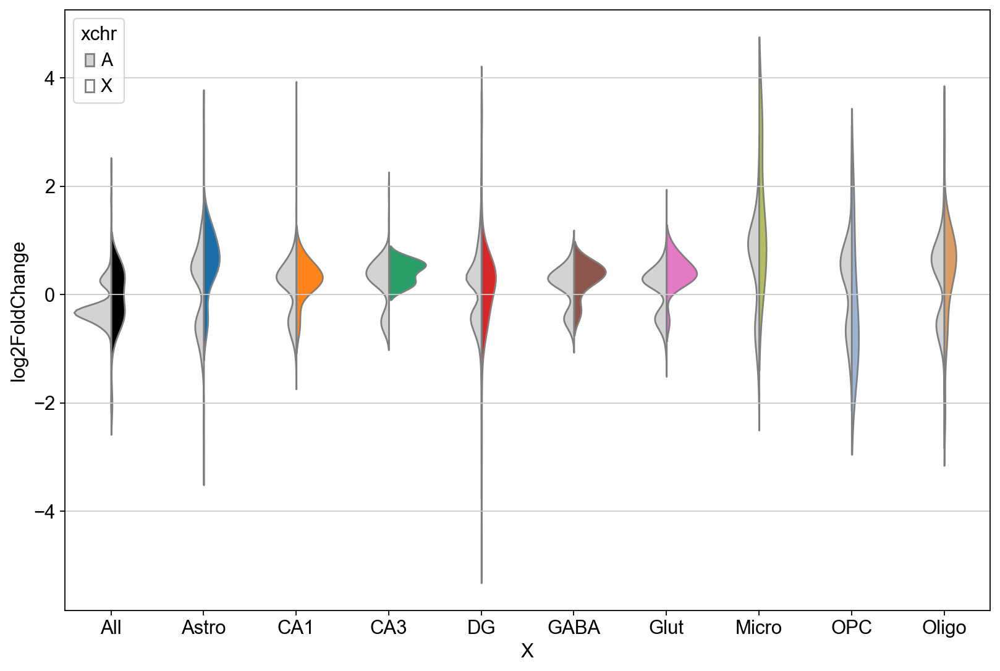

In [426]:
#DEG violin plot 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

#  cell type colors
category_colors = {
    'All': 'black',
    'Astro': '#1c6ea8',
    'CA1': '#ff841b',
    'CA3': '#299e69',
    'DG': '#d62829',
    'GABA': '#8c564c',
    'Glut': '#e37ac4',
    'Micro': '#b5bd62',
    'OPC': '#9eb5d4',
    'Oligo': '#d99f66'
}

# significant degs
df_filtered = concatenated_df[concatenated_df['sig'] == 's']

#plot size
plt.figure(figsize=(12, 8))

# split violin 
sns.violinplot(x='X', y='log2FoldChange', hue='xchr', data=df_filtered, split=True, inner=None, palette={'A': 'lightgrey', 'X': 'white'})

#  violin plot colors
for i, x_val in enumerate(df_filtered['X'].unique()):
    for violin in plt.gca().collections[i*2+1::2]:  # Select the right side patches
        violin.set_facecolor(category_colors.get(x_val, 'black'))  # Apply the color from category_colors, default to 'black' if not found

# axis labels 
plt.xlabel('X')
plt.ylabel('log2FoldChange')

# plot
plt.show()


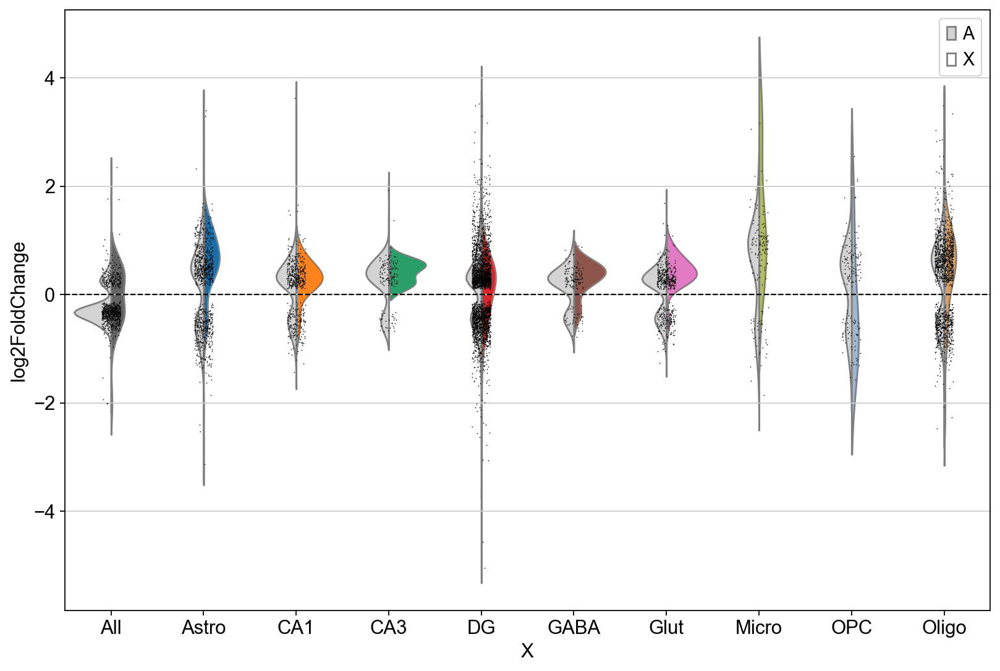

In [427]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

#  cell type colors
category_colors = {
    'All': '#636363',
    'Astro': '#1c6ea8',
    'CA1': '#ff841b',
    'CA3': '#299e69',
    'DG': '#d62829',
    'GABA': '#8c564c',
    'Glut': '#e37ac4',
    'Micro': '#b5bd62',
    'OPC': '#9eb5d4',
    'Oligo': '#d99f66'
}

# significant DEGs
df_filtered = concatenated_df[concatenated_df['sig'] == 's']

# size
plt.figure(figsize=(12, 8))

#split violin
sns.violinplot(x='X', y='log2FoldChange', hue='xchr', data=df_filtered, split=True, inner=None, palette={'A': 'lightgrey', 'X': 'white'})

#  violin plot colors
for i, x_val in enumerate(df_filtered['X'].unique()):
    for violin in plt.gca().collections[i*2+1::2]:  # Select the right side patches
        violin.set_facecolor(category_colors.get(x_val, 'black'))  # Apply the color from category_colors, default to 'black' if not found

# y=0 dotted line 
plt.axhline(0, color='black', linestyle='--', linewidth=1)

# datapoints on graph 
sns.stripplot(x='X', y='log2FoldChange', data=df_filtered, color='black', size=.75, jitter=True, dodge=True)

# axis labels
plt.xlabel('X')
plt.ylabel('log2FoldChange')

#plot
plt.show()


